<a href="https://colab.research.google.com/github/karthibk02/e-commerace/blob/main/Copy_of_ecommerace_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'e-commerce-sales-analysis:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F5334362%2F8860357%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240725%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240725T125023Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D687af4459324c4e586b3d3222fc1f1b50a83b6804d09a784f192ff09e4f60a7230143050787212bfb810104554105cc51bd3e0b0ea5f368f350c0ae455767c1c93dc11b140652723550c81f88b935a01e309e076b0421eda97d64efa605fa987a68eccb580969cbd1d2caecf3bf5d1d365958c4223b34d84654e1cafc7f532f0e21f6f8f749fe1310bd494b7db04c90f6d67fe28398107063e4b514110c513910ddd7fb699837a6c5c49dfebfcfe6a23b315d70217759446021a6fb918c4dc1db75bcaaa726a30a9c0aaf9f4879f6976fbc02a06d0d7b207d63478cf6a489898533c237b6370a41d827cafa4fbaeb878947f2cc30c5f979519eefb3a12c7ff5f'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 35641 bytes downloaded
Downloaded and uncompressed: e-commerce-sales-analysis
Data source import complete.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/e-commerce-sales-analysis/ecommerce_sales_analysis.csv


In [ ]:
from IPython.core.display import HTML
# Apply styles globally within the notebook
HTML('''
<style>
   h2 {
    font-size: var(--jp-content-font-size4);
    background-color: #5050dc;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

img{
    # flex-grow: 1;
    # flex-shrink: 1;
    border-radius: 150px 70px 150px 70px;
    border: 10px solid #eee;
    display: flex;
    align-items: center;
    justify-content: center;
}
</style>
''')

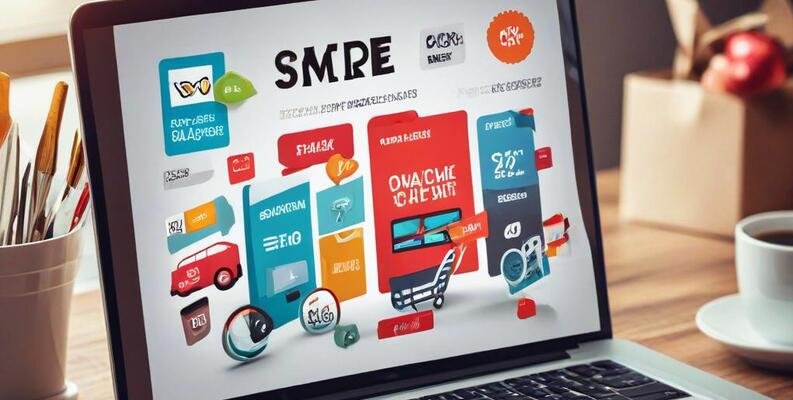

In [ ]:
import IPython.display
import requests
from PIL import Image
from io import BytesIO

# URL of the image
image_url = 'https://storage.googleapis.com/kaggle-datasets-images/5334362/8860357/df629d08164bc1f8abc8fcf4fbd9e766/dataset-cover.png?t=2024-07-04-20-09-18'

# Fetch the image from the URL
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

# Display the image
IPython.display.display(img)

##  -- >> if you found my Notebook useful Dont forget to upvot me :

## Analysis Data

In [ ]:
# imports:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler , LabelEncoder


In [ ]:
# load the dataset :

data=pd.read_csv("/kaggle/input/e-commerce-sales-analysis/ecommerce_sales_analysis.csv")
data.head(15)

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257
5,6,Product_6,Toys,82.22,3.6,270,834,288,38,422,329,245,614,979,851,630,738,485
6,7,Product_7,Electronics,33.75,3.8,632,565,140,539,244,188,700,896,965,447,66,32,516
7,8,Product_8,Electronics,433.76,4.4,906,905,83,48,926,94,555,280,102,202,753,376,445
8,9,Product_9,Electronics,302.55,2.0,848,809,693,419,106,616,85,42,992,696,298,213,708
9,10,Product_10,Clothing,355.50,3.0,400,319,390,636,87,7,555,485,566,632,462,561,179


In [ ]:
# some information about the data:
print(data.info())
print("-"*50)
print(data.dtypes)
print("-"*50)
print(np.shape(data))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      1000 non-null   int64  
 1   product_name    1000 non-null   object 
 2   category        1000 non-null   object 
 3   price           1000 non-null   float64
 4   review_score    1000 non-null   float64
 5   review_count    1000 non-null   int64  
 6   sales_month_1   1000 non-null   int64  
 7   sales_month_2   1000 non-null   int64  
 8   sales_month_3   1000 non-null   int64  
 9   sales_month_4   1000 non-null   int64  
 10  sales_month_5   1000 non-null   int64  
 11  sales_month_6   1000 non-null   int64  
 12  sales_month_7   1000 non-null   int64  
 13  sales_month_8   1000 non-null   int64  
 14  sales_month_9   1000 non-null   int64  
 15  sales_month_10  1000 non-null   int64  
 16  sales_month_11  1000 non-null   int64  
 17  sales_month_12  1000 non-null   in

In [ ]:
# Make some Statisticals on the dataset :

data.describe().T

,count,mean,std,min,25%,50%,75%,max
product_id,1000.0,500.50000,288.819436,1.00,250.75,500.50,750.250,1000.00
price,1000.0,247.67713,144.607983,7.29,121.81,250.92,373.435,499.86
review_score,1000.0,3.02760,1.171243,1.00,2.00,3.10,4.000,5.00
review_count,1000.0,526.50600,282.269932,1.00,283.75,543.00,772.000,999.00
sales_month_1,1000.0,498.30600,289.941478,0.00,245.50,507.50,740.750,1000.00
sales_month_2,1000.0,507.66100,285.992689,2.00,262.50,508.00,756.250,1000.00
sales_month_3,1000.0,506.73900,294.010873,0.00,243.75,493.00,777.250,999.00
sales_month_4,1000.0,503.82300,286.645567,0.00,261.50,501.50,749.500,1000.00
sales_month_5,1000.0,487.19400,287.844324,0.00,221.00,497.00,727.000,1000.00
sales_month_6,1000.0,491.65300,289.234018,0.00,236.00,479.50,740.500,1000.00


In [ ]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns
    num_cols=data.select_dtypes("number").columns
    disc_cols=data.select_dtypes(include=("int64")).columns
    conts_cols=data.select_dtypes(include=("float64")).columns
    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['product_name', 'category'], dtype='object')
 Numerical_columns ----->>> Index(['product_id', 'price', 'review_score', 'review_count', 'sales_month_1',
       'sales_month_2', 'sales_month_3', 'sales_month_4', 'sales_month_5',
       'sales_month_6', 'sales_month_7', 'sales_month_8', 'sales_month_9',
       'sales_month_10', 'sales_month_11', 'sales_month_12'],
      dtype='object') 
 Discrete_columns ---->>> Index(['product_id', 'review_count', 'sales_month_1', 'sales_month_2',
       'sales_month_3', 'sales_month_4', 'sales_month_5', 'sales_month_6',
       'sales_month_7', 'sales_month_8', 'sales_month_9', 'sales_month_10',
       'sales_month_11', 'sales_month_12'],
      dtype='object') 
 Continous_cols ----->> Index(['price', 'review_score'], dtype='object') 
 Nominal Columns --->> Series([], dtype: int64)


In [ ]:
#check if there null values in data:
# NO Found any null values :
data.isna().mean()

product_id        0.0
product_name      0.0
category          0.0
price             0.0
review_score      0.0
review_count      0.0
sales_month_1     0.0
sales_month_2     0.0
sales_month_3     0.0
sales_month_4     0.0
sales_month_5     0.0
sales_month_6     0.0
sales_month_7     0.0
sales_month_8     0.0
sales_month_9     0.0
sales_month_10    0.0
sales_month_11    0.0
sales_month_12    0.0
dtype: float64

In [ ]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in product_id -->> 
 product_id
1       1
672     1
659     1
660     1
661     1
       ..
339     1
340     1
341     1
342     1
1000    1
Name: count, Length: 1000, dtype: int64
-------------------------
counts of items in product_name -->> 
 product_name
Product_1       1
Product_672     1
Product_659     1
Product_660     1
Product_661     1
               ..
Product_339     1
Product_340     1
Product_341     1
Product_342     1
Product_1000    1
Name: count, Length: 1000, dtype: int64
-------------------------
counts of items in category -->> 
 category
Books             154
Sports            153
Toys              151
Clothing          140
Health            139
Electronics       138
Home & Kitchen    125
Name: count, dtype: int64
-------------------------
counts of items in price -->> 
 price
400.71    2
485.11    2
318.53    2
97.35     2
362.52    2
         ..
239.72    1
53.43     1
248.35    1
239.37    1
225.77    1
Name: count, Length: 992, dtype: int64
-

In [ ]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>product_id column  :  
[   1    2    3    4    5    6    7    8    9   10   11   12   13   14
   15   16   17   18   19   20   21   22   23   24   25   26   27   28
   29   30   31   32   33   34   35   36   37   38   39   40   41   42
   43   44   45   46   47   48   49   50   51   52   53   54   55   56
   57   58   59   60   61   62   63   64   65   66   67   68   69   70
   71   72   73   74   75   76   77   78   79   80   81   82   83   84
   85   86   87   88   89   90   91   92   93   94   95   96   97   98
   99  100  101  102  103  104  105  106  107  108  109  110  111  112
  113  114  115  116  117  118  119  120  121  122  123  124  125  126
  127  128  129  130  131  132  133  134  135  136  137  138  139  140
  141  142  143  144  145  146  147  148  149  150  151  152  153  154
  155  156  157  158  159  160  161  162  163  164  165  166  167  168
  169  170  171  172  173  174  175  176  177  178  179  180  181  182
  183  184  185  186  187  188

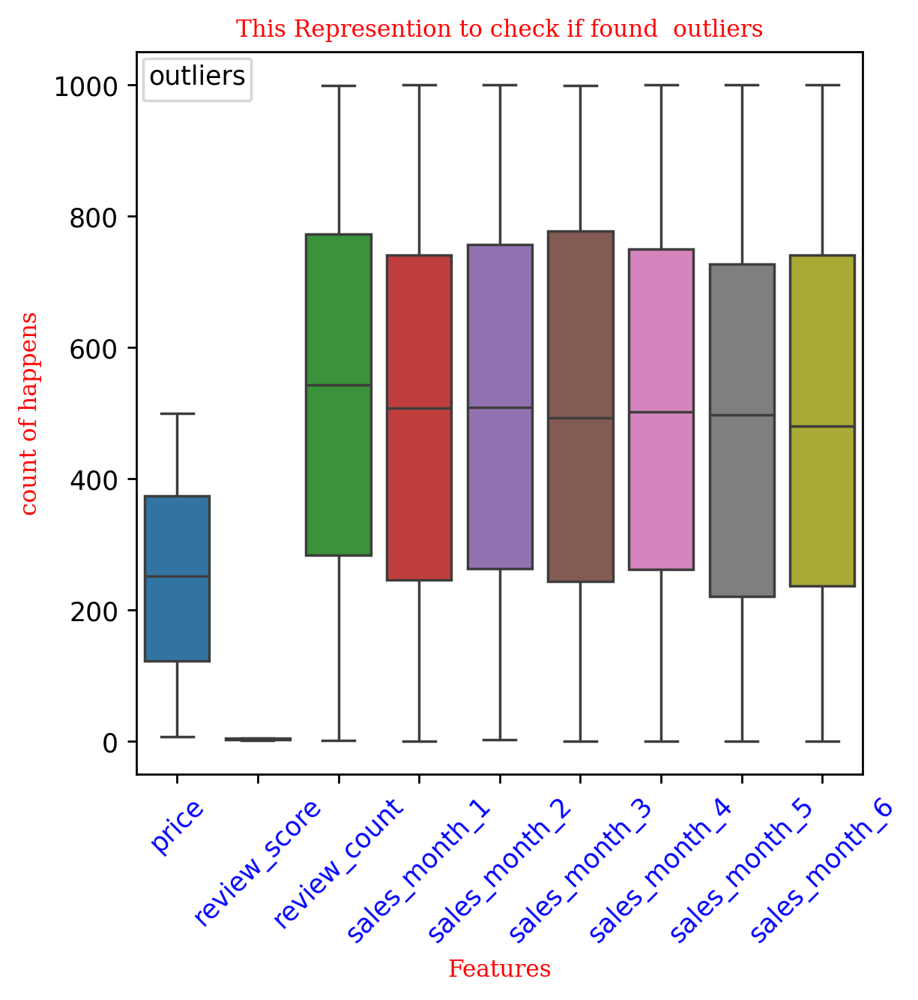

In [ ]:
# from this Represention we discover that NO outliers found :

features=["price","review_score","review_count","sales_month_1","sales_month_2","sales_month_3","sales_month_4","sales_month_5","sales_month_6"]
f1={"family":"serif","size":9,"color":"r"}
plt.figure(figsize=(5,5),dpi=250)
plt.title("This Represention to check if found  outliers",fontdict=f1)
plt.xlabel("Features",fontdict=f1)
plt.ylabel("count of happens",fontdict=f1)
plt.xticks(rotation=45,color="b")
sns.boxplot(data[features])
plt.legend(title="outliers",prop={'size': 5})

In [ ]:
# Check if there are aduplicated values in the data and remove it if found any  :
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)

Number of duplicates ----->>>  0


In [ ]:
data.drop_duplicates()

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Product_996,Home & Kitchen,50.33,3.6,494,488,359,137,787,678,970,282,155,57,575,634,393
996,997,Product_997,Home & Kitchen,459.07,4.8,701,18,906,129,78,19,110,403,683,104,858,729,474
997,998,Product_998,Sports,72.73,1.3,287,725,109,193,657,215,337,664,476,265,344,888,654
998,999,Product_999,Sports,475.37,1.2,720,196,191,315,622,854,122,65,938,521,268,60,394


In [ ]:
for col in features:
    Q1_col,Q3_col=data[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in data[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)}")
    print("-"*25)

 * -- >> there No outlier in price feature
Q1 of price --->>> 121.81 
 Q3 of price ---->>> 373.435 
 iqr--->>251.625
 low_limit--->>>-255.6275 
  upper_limit--->>> 750.8725 
 outlier---->>> [] 
 Number of outliers --->>> 0
-------------------------
 * -- >> there No outlier in review_score feature
Q1 of review_score --->>> 2.0 
 Q3 of review_score ---->>> 4.0 
 iqr--->>2.0
 low_limit--->>>-1.0 
  upper_limit--->>> 7.0 
 outlier---->>> [] 
 Number of outliers --->>> 0
-------------------------
 * -- >> there No outlier in review_count feature
Q1 of review_count --->>> 283.75 
 Q3 of review_count ---->>> 772.0 
 iqr--->>488.25
 low_limit--->>>-448.625 
  upper_limit--->>> 1504.375 
 outlier---->>> [] 
 Number of outliers --->>> 0
-------------------------
 * -- >> there No outlier in sales_month_1 feature
Q1 of sales_month_1 --->>> 245.5 
 Q3 of sales_month_1 ---->>> 740.75 
 iqr--->>495.25
 low_limit--->>>-497.375 
  upper_limit--->>> 1483.625 
 outlier---->>> [] 
 Number of outliers --

## Some feature Engeneering:

In [ ]:
# create a New feature of sum of months_sales:
data["total_sales"]=data.loc[:,"sales_month_1":"sales_month_12"].sum(axis=1)
data.head(10)

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306,6421
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353,6027
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392,5580
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203,5022
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257,6094
5,6,Product_6,Toys,82.22,3.6,270,834,288,38,422,329,245,614,979,851,630,738,485,6453
6,7,Product_7,Electronics,33.75,3.8,632,565,140,539,244,188,700,896,965,447,66,32,516,5298
7,8,Product_8,Electronics,433.76,4.4,906,905,83,48,926,94,555,280,102,202,753,376,445,4769
8,9,Product_9,Electronics,302.55,2.0,848,809,693,419,106,616,85,42,992,696,298,213,708,5677
9,10,Product_10,Clothing,355.50,3.0,400,319,390,636,87,7,555,485,566,632,462,561,179,4879


In [ ]:
# calculating total revenue for each product
df['total_revenue']=df['price']*df['total_sales']
# Sort products by total sales
top_products = df.sort_values(by='total_revenue', ascending=False)

# Select the top 10 best selling products
top_10_products = top_products.head(10)

# Display the top 10 best selling products
top_10_products

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales,total_revenue
305,306,Product_306,Books,488.05,4.5,943,539,963,932,809,502,335,433,402,616,981,674,625,7811,3812158.55
531,532,Product_532,Books,499.86,3.4,162,667,48,734,711,658,950,989,438,588,615,829,303,7530,3763945.80
52,53,Product_53,Sports,470.05,4.8,313,193,97,734,961,798,842,765,913,953,746,885,33,7920,3722796.00
228,229,Product_229,Electronics,446.56,4.9,758,905,720,607,789,849,949,270,745,722,72,756,898,8282,3698409.92
390,391,Product_391,Books,495.30,1.9,507,527,234,510,1000,918,948,681,784,656,177,444,491,7370,3650361.00
522,523,Product_523,Toys,485.11,2.4,772,619,715,959,382,846,997,596,873,22,471,501,370,7351,3566043.61
140,141,Product_141,Books,481.41,4.3,376,159,799,236,453,537,667,816,559,791,579,888,890,7374,3549917.34
112,113,Product_113,Clothing,465.20,1.9,435,564,946,876,922,731,719,364,228,838,695,156,528,7567,3520168.40
751,752,Product_752,Health,470.22,1.9,118,247,858,503,849,928,518,392,378,32,955,873,951,7484,3519126.48
475,476,Product_476,Toys,496.52,3.7,325,558,628,738,978,439,803,30,920,177,643,591,576,7081,3515858.12


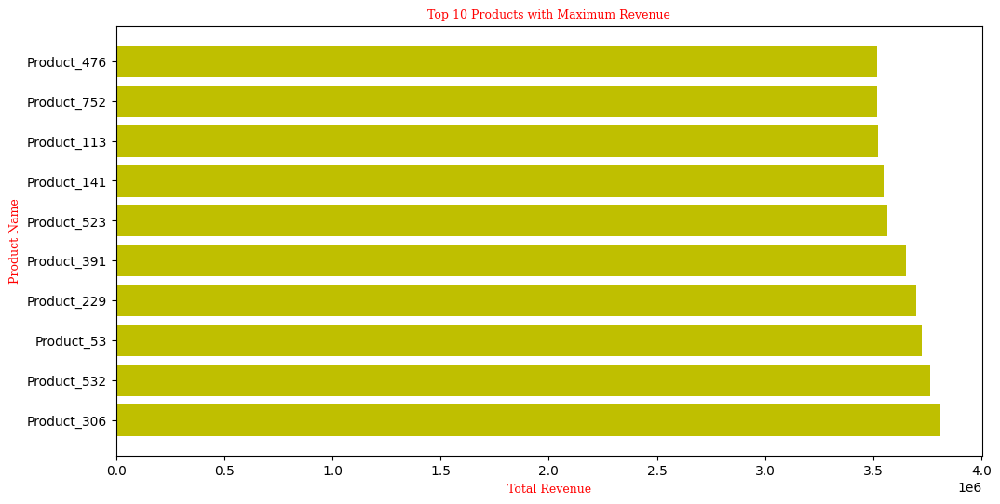

In [ ]:
# Top 10 Performing Products
plt.figure(figsize=(12, 6))
plt.barh(top_10_products['product_name'], top_10_products['total_revenue'], color='y')
plt.xlabel('Total Revenue',fontdict=f1)
plt.ylabel('Product Name',fontdict=f1)
plt.title('Top 10 Products with Maximum Revenue',fontdict=f1)
plt.show()

## Make some Visualization to cover the Dataset:

Text(0.5, 1.0, 'Categories')

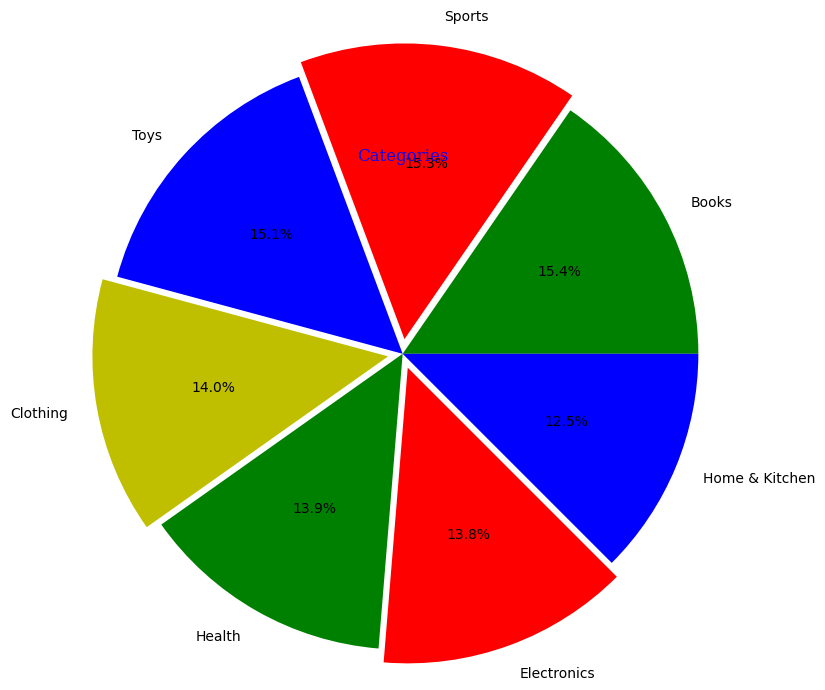

In [ ]:
# make observation for this features : product_name , category

# Font style for titles
f1 = {"family": "serif", "size": 12, "color": "b"}
# Plot 1
category = data["category"].value_counts()
plt.pie(
    x=category,
    labels=["Books","Sports","Toys","Clothing","Health","Electronics","Home & Kitchen"],
    colors=["g", "r","b","y"],
    explode=[0, 0.1,0,0.1,0,0.1,0],
    autopct='%1.1f%%',
    radius=2,
)
plt.title("Categories", fontdict=f1)


<ipython-input-22-c611f8ab1b73>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')


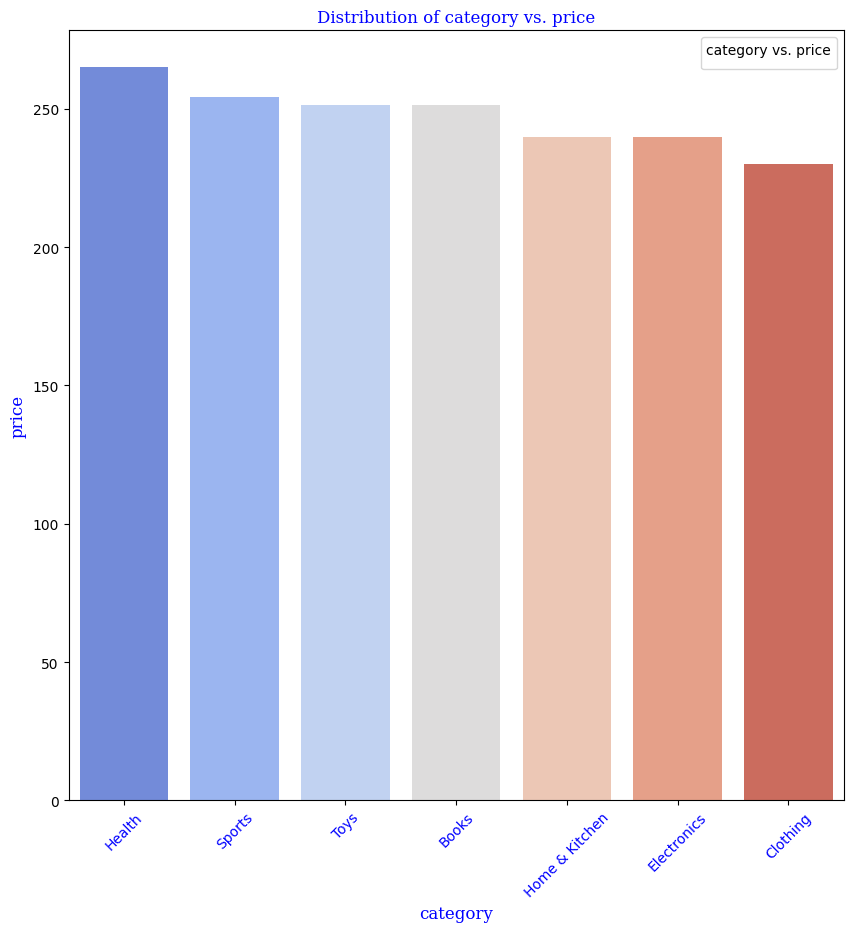

In [ ]:
# to observe Any categorey have the highest price:
# oserve the category vs. price:

plt.figure(figsize=(10,10))
plt.title("Distribution of category vs. price",fontdict=f1)
top=data.groupby("category")["price"].mean().sort_values(ascending=False)
sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')
plt.xticks(rotation=45,color="b")
plt.xlabel("category",fontdict=f1)
plt.ylabel("price",fontdict=f1)
plt.legend(title="category vs. price")
plt.show()


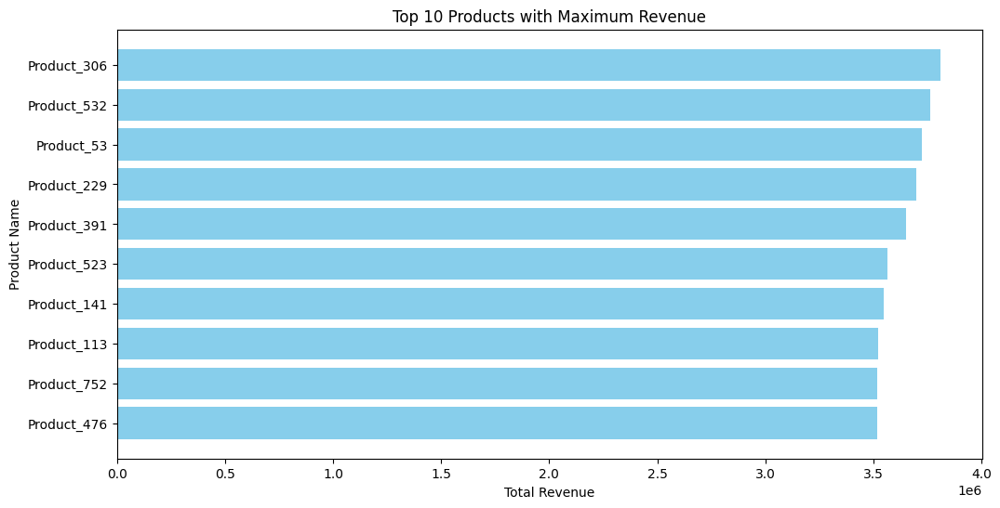

In [ ]:
# Top 10 Performing Products
plt.figure(figsize=(12, 6))
plt.barh(top_10_products['product_name'], top_10_products['total_revenue'], color='skyblue')
plt.xlabel('Total Revenue')
plt.ylabel('Product Name')
plt.title('Top 10 Products with Maximum Revenue')
plt.gca().invert_yaxis()
plt.show()

<ipython-input-24-da989474fb2e>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')


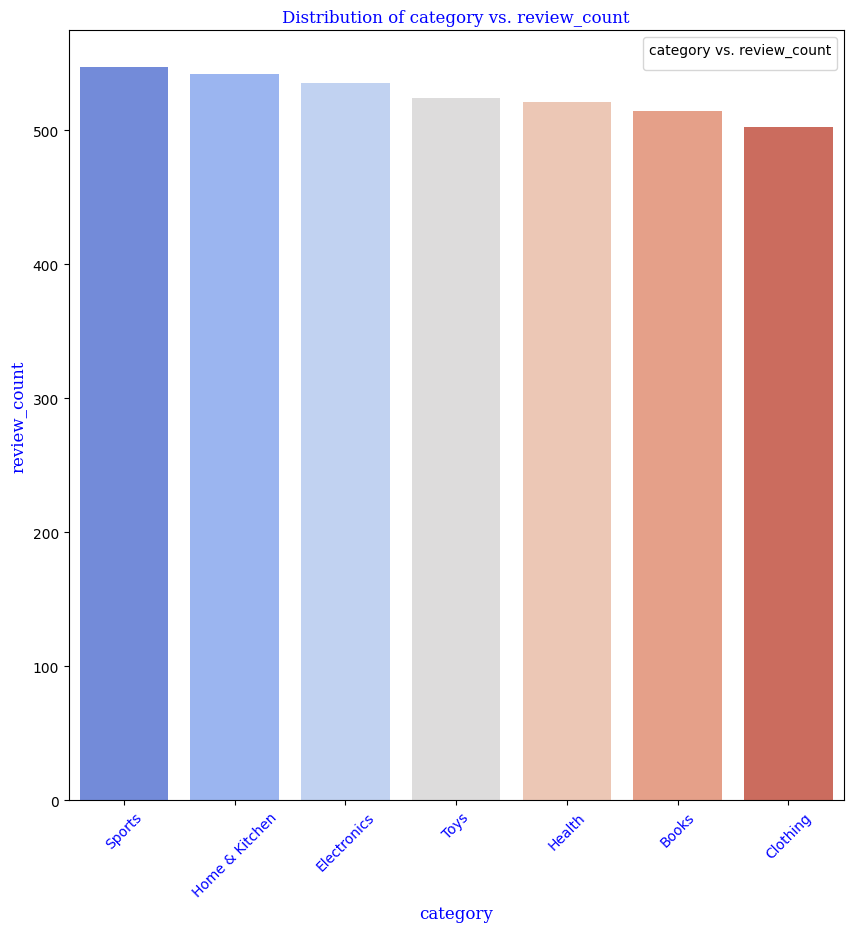

In [ ]:
# barchart for categorey .vs reviews_counts:
# oserve the category vs. reviews_counts:

plt.figure(figsize=(10,10))
plt.title("Distribution of category vs. review_count",fontdict=f1)
top=data.groupby("category")["review_count"].mean().sort_values(ascending=False)
sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')
plt.xticks(rotation=45,color="b")
plt.xlabel("category",fontdict=f1)
plt.ylabel("review_count",fontdict=f1)
plt.legend(title="category vs. review_count")
plt.show()

<ipython-input-25-30ce9c449883>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')


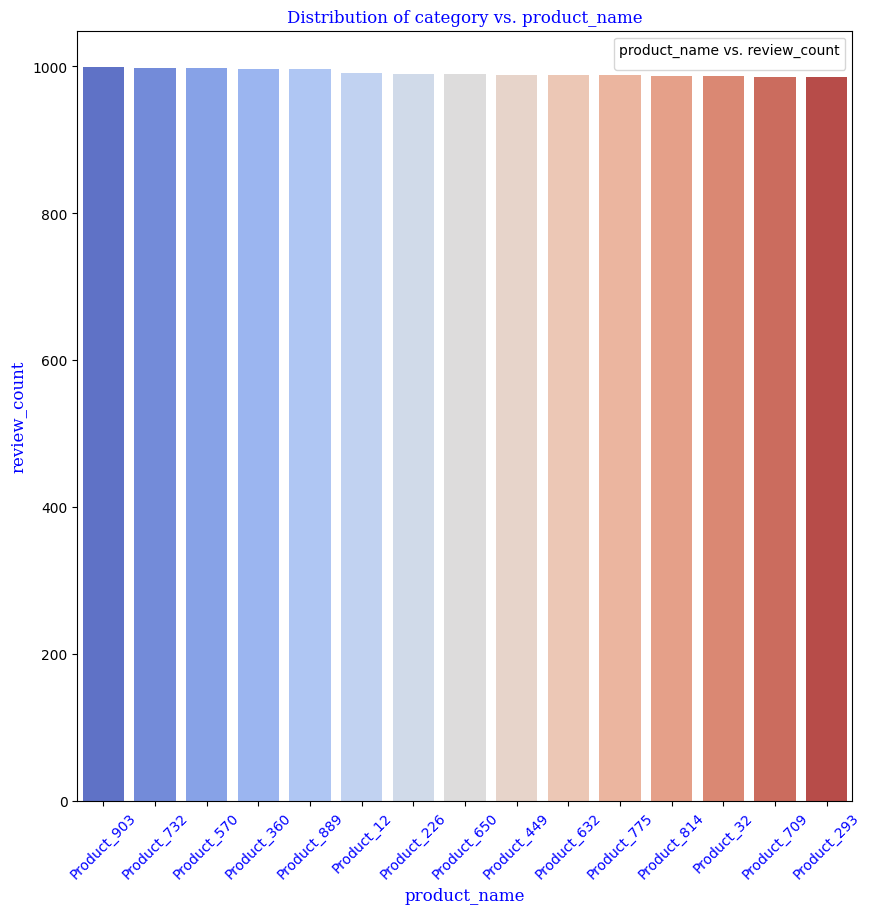

In [ ]:
# barchart for product_name .vs reviews_counts:
# oserve the product_name vs. reviews_counts:

plt.figure(figsize=(10,10))
plt.title("Distribution of category vs. product_name",fontdict=f1)
top=data.groupby("product_name")["review_count"].mean().sort_values(ascending=False).head(15)
sns.barplot(x=top.index,y=top.values,color="r",palette='coolwarm')
plt.xticks(rotation=45,color="b")
plt.xlabel("product_name",fontdict=f1)
plt.ylabel("review_count",fontdict=f1)
plt.legend(title="product_name vs. review_count")
plt.show()

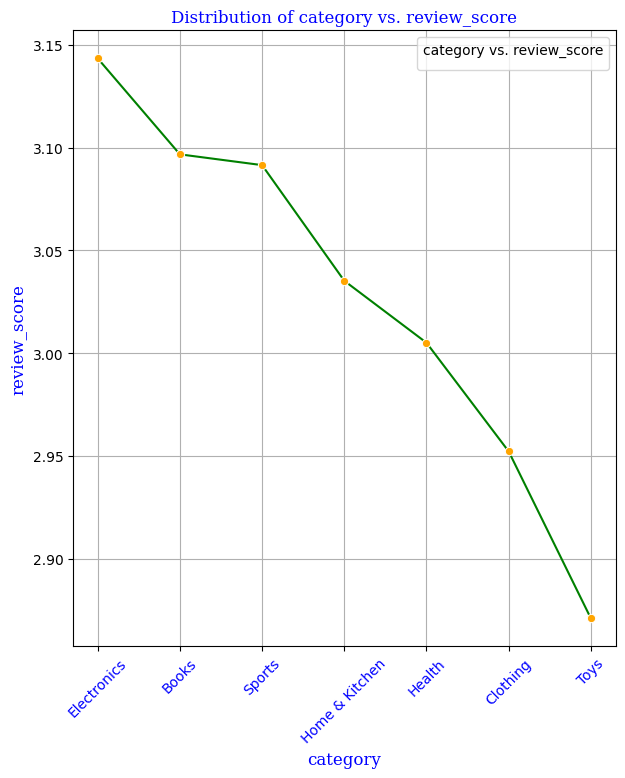

In [ ]:
# to observe Any categorey have the highest review_score::
# oserve the category vs. price:

plt.figure(figsize=(7,8))
plt.title("Distribution of category vs. review_score",fontdict=f1)
top=data.groupby("category")["review_score"].mean().sort_values(ascending=False)
sns.lineplot(x=top.index,y=top.values,color="g",marker="o",mfc="orange")
plt.xticks(rotation=45,color="b")
plt.xlabel("category",fontdict=f1)
plt.ylabel("review_score",fontdict=f1)
plt.legend(title="category vs. review_score")
plt.grid(True)
plt.show()

In [ ]:
monthly_sales = df.loc[:, 'sales_month_1':'sales_month_12'].sum()
monthly_sales

sales_month_1     498306
sales_month_2     507661
sales_month_3     506739
sales_month_4     503823
sales_month_5     487194
sales_month_6     491653
sales_month_7     507011
sales_month_8     504569
sales_month_9     491934
sales_month_10    514798
sales_month_11    505838
sales_month_12    500386
dtype: int64

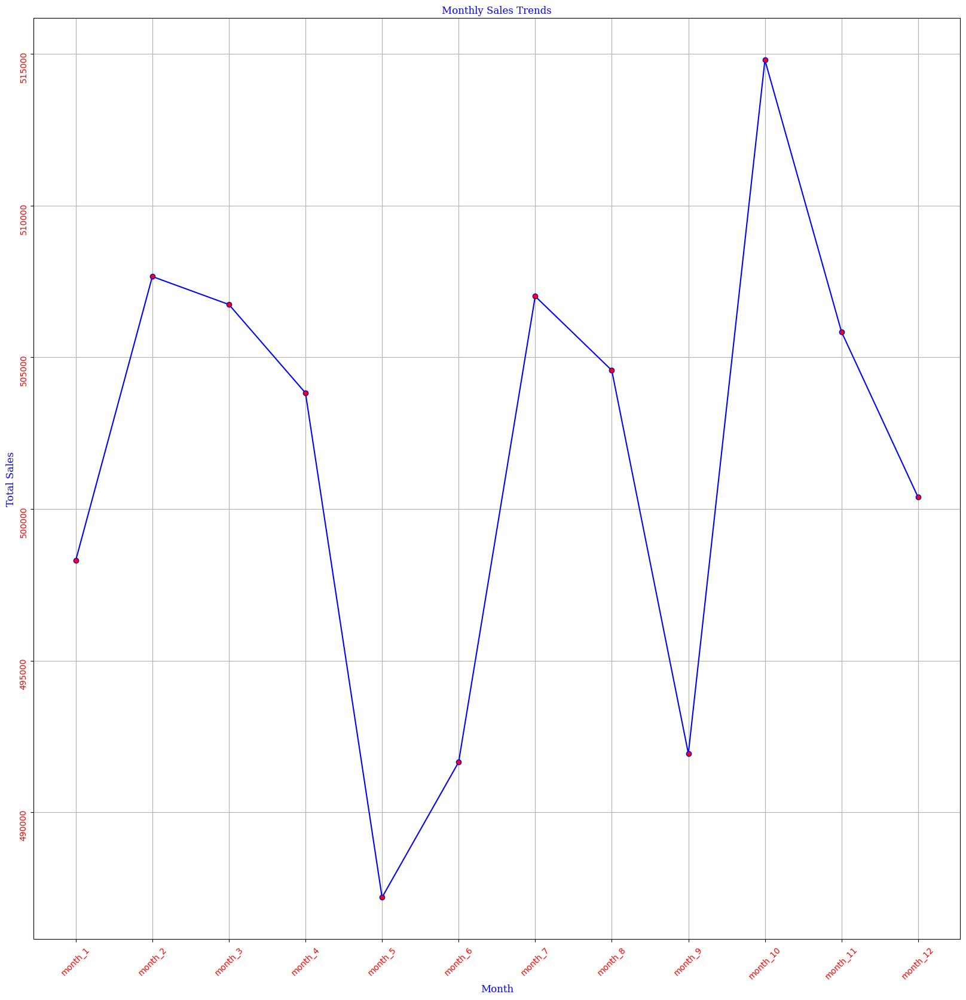

In [ ]:
#trend of monthes_sales:

months=["month_1","month_2","month_3","month_4","month_5","month_6","month_7","month_8","month_9","month_10","month_11","month_12"]
plt.figure(figsize=(20, 20))
plt.plot(months, monthly_sales, marker='o', linestyle='-', color='b',mfc="r")
plt.xlabel('Month',fontdict=f1)
plt.ylabel('Total Sales',fontdict=f1)
plt.title('Monthly Sales Trends',fontdict=f1)
plt.xticks(rotation=45,color="r")
plt.yticks(rotation=90,color="r")
plt.grid(True)
plt.show()

## Monthly Sales Trends by Category

In [ ]:
category_monthly_sales = df.groupby('category').sum().loc[:, 'sales_month_1':'sales_month_12']

category_monthly_sales.head()

,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12
category,,,,,,,,,,,,
Books,77932,80079,76998,74699,79051,76644,79114,78108,77211,83504,76557,78332
Clothing,60966,67911,76796,70088,61643,63123,66105,74422,72675,68806,71683,72318
Electronics,76347,72472,70708,73158,72169,70060,72223,65754,69914,70148,68148,64019
Health,67644,67432,67602,72925,69178,63926,75256,69126,64581,72613,72500,71631
Home & Kitchen,57844,57252,62667,65388,59766,63169,60129,65042,58135,64876,66281,61592


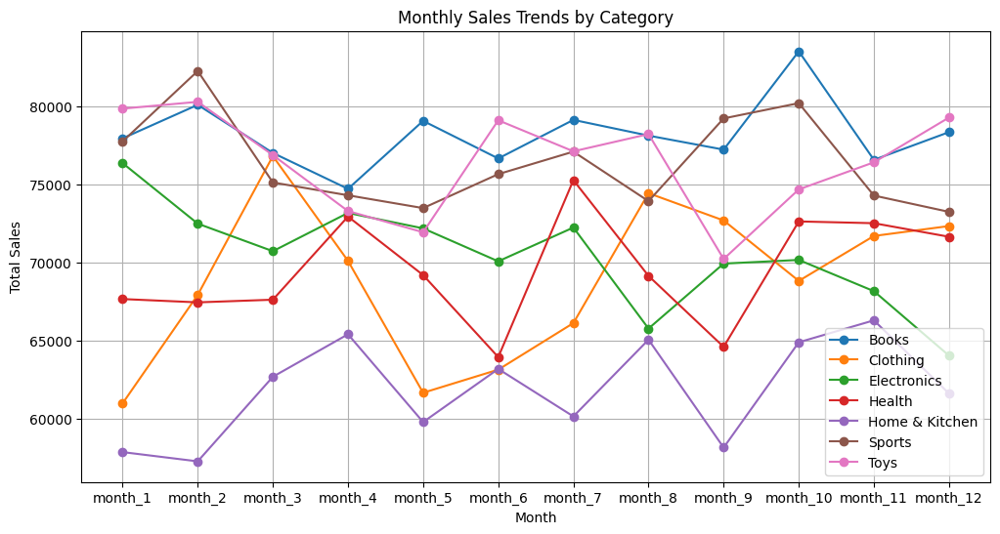

In [ ]:
plt.figure(figsize=(12, 6))

for category in category_monthly_sales.index:
    plt.plot(months, category_monthly_sales.loc[category], marker='o', linestyle='-', label=category)

plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales Trends by Category')
plt.legend()
plt.grid(True)
plt.show()

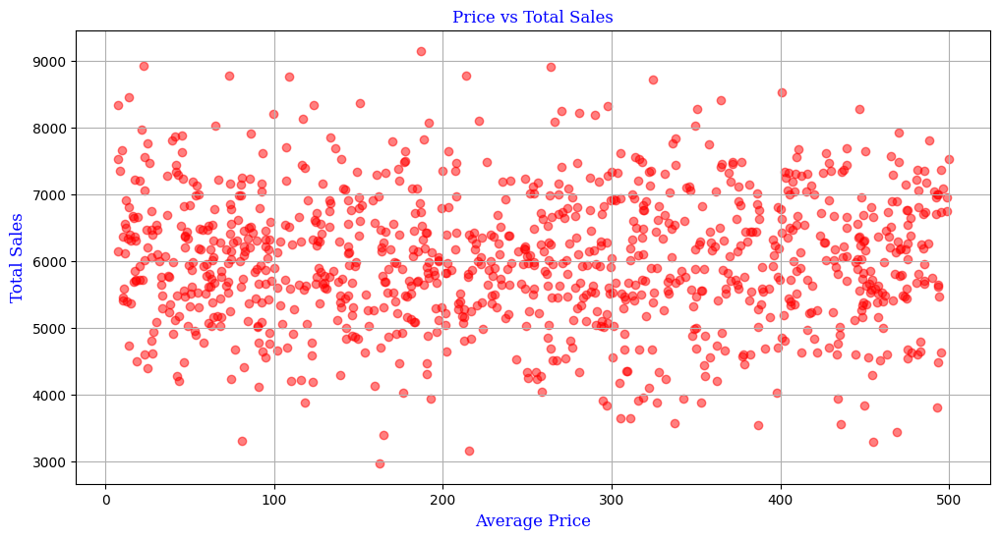

In [ ]:
df['total_sales'] = df.loc[:, 'sales_month_1':'sales_month_12'].sum(axis=1)

average_prices = df.groupby('product_id')['price'].mean().reset_index()

df_merged = pd.merge(df, average_prices, on='product_id', how='inner', suffixes=('', '_average'))

correlation = df_merged['price_average'].corr(df_merged['total_sales'])

# Scatter plot of price vs total sales
plt.figure(figsize=(12, 6))
plt.scatter(df_merged['price_average'], df_merged['total_sales'], alpha=0.5,color="r")
plt.xlabel('Average Price',fontdict=f1)
plt.ylabel('Total Sales',fontdict=f1)
plt.title('Price vs Total Sales',fontdict=f1)
plt.grid(True)
plt.show()

array([[<Axes: title={'center': 'product_id'}>,
        <Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'review_score'}>,
        <Axes: title={'center': 'review_count'}>],
       [<Axes: title={'center': 'sales_month_1'}>,
        <Axes: title={'center': 'sales_month_2'}>,
        <Axes: title={'center': 'sales_month_3'}>,
        <Axes: title={'center': 'sales_month_4'}>],
       [<Axes: title={'center': 'sales_month_5'}>,
        <Axes: title={'center': 'sales_month_6'}>,
        <Axes: title={'center': 'sales_month_7'}>,
        <Axes: title={'center': 'sales_month_8'}>],
       [<Axes: title={'center': 'sales_month_9'}>,
        <Axes: title={'center': 'sales_month_10'}>,
        <Axes: title={'center': 'sales_month_11'}>,
        <Axes: title={'center': 'sales_month_12'}>],
       [<Axes: title={'center': 'total_sales'}>,
        <Axes: title={'center': 'total_revenue'}>, <Axes: >, <Axes: >]],
      dtype=object)

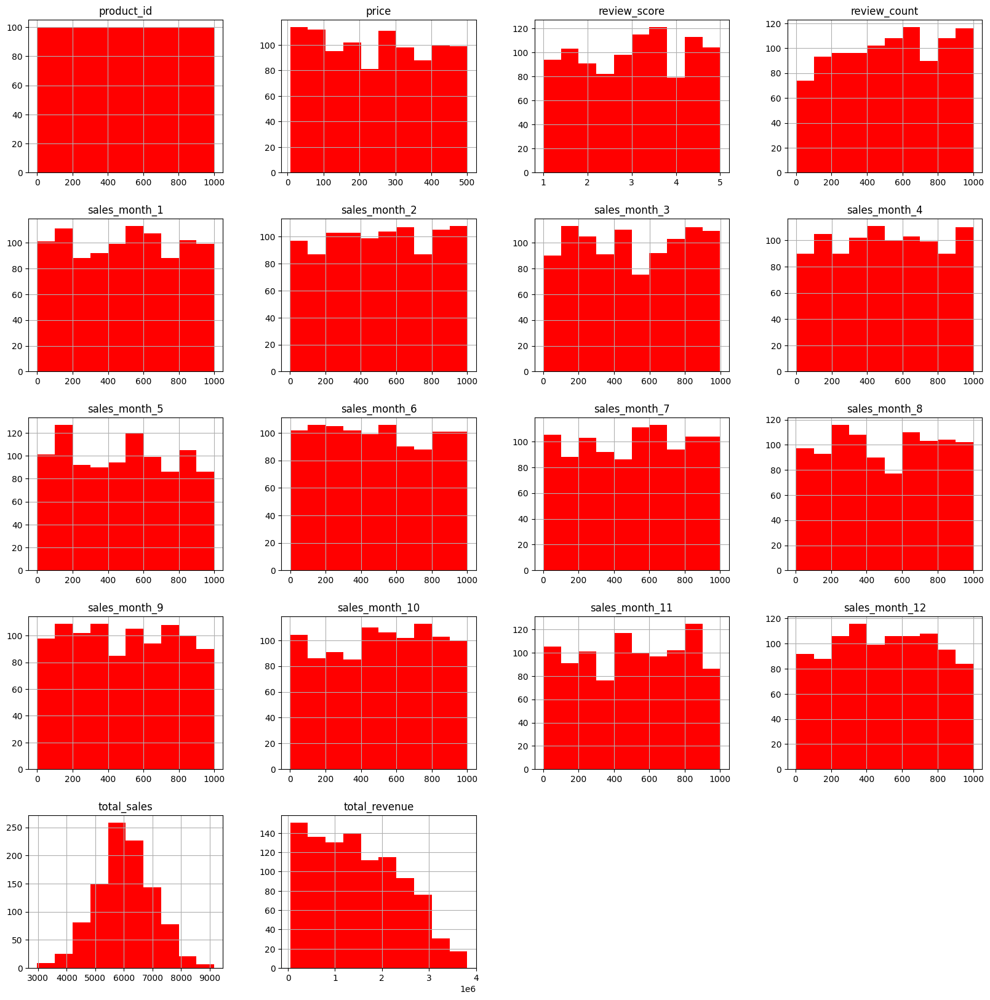

In [ ]:
# hist of data:
data.hist(figsize=(20,20),color="r")

<Figure size 30000x30000 with 0 Axes>

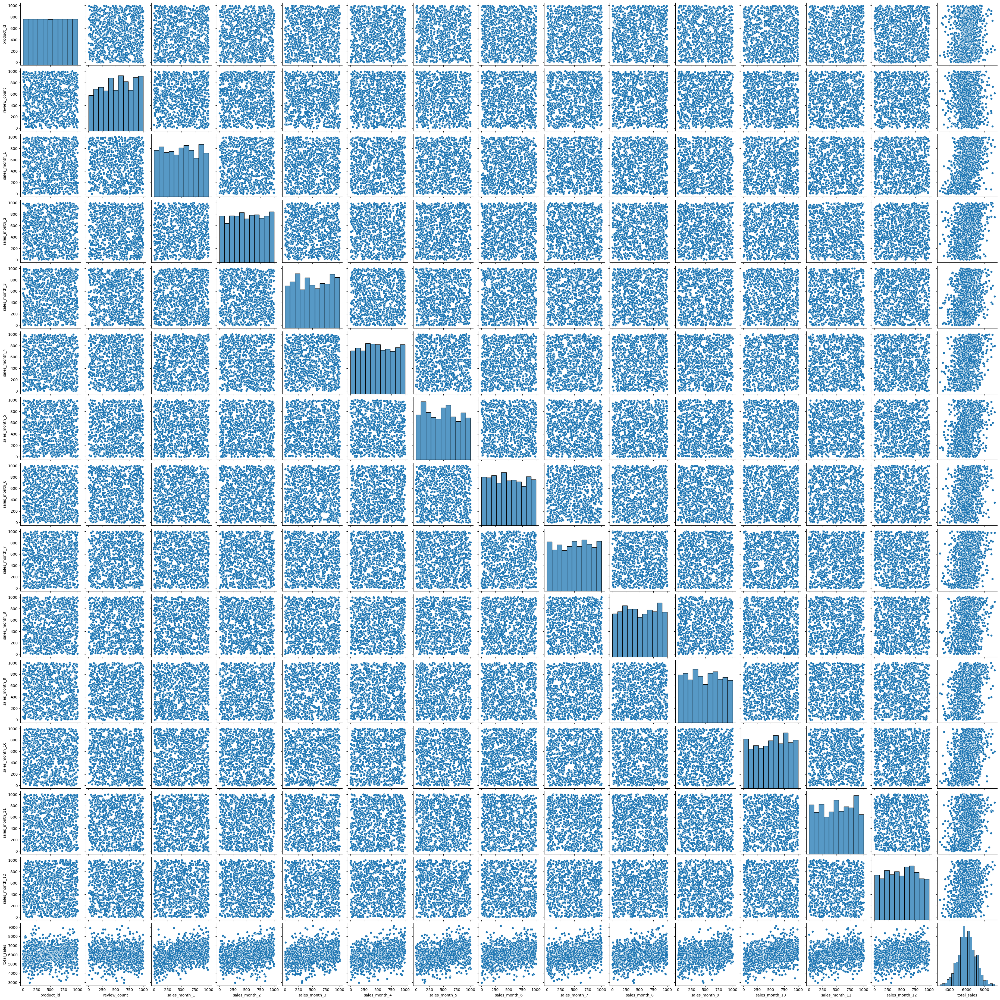

In [ ]:
# scatterplots & barplot to cover on the discrete_features:

plt.figure(figsize=(100,100),dpi=300)
sns.pairplot(data.select_dtypes(include="int64"))

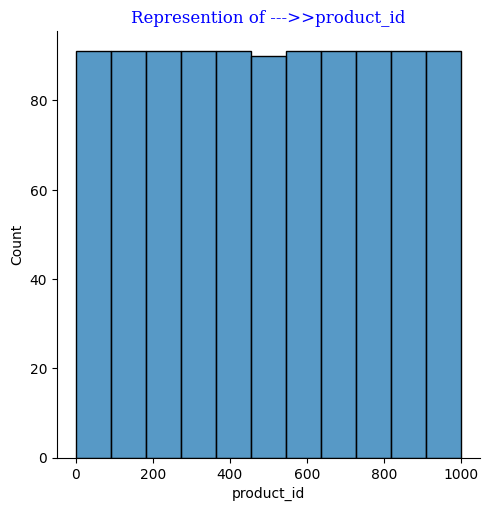

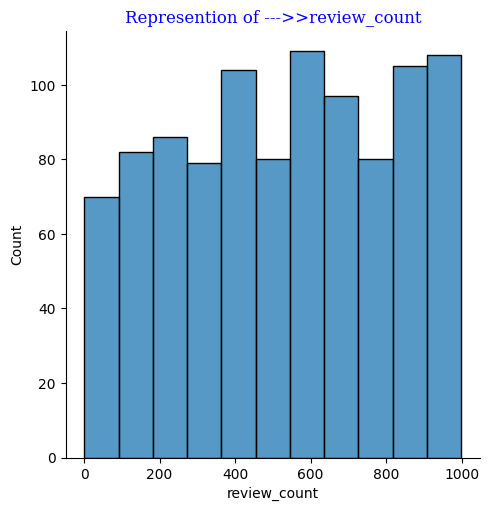

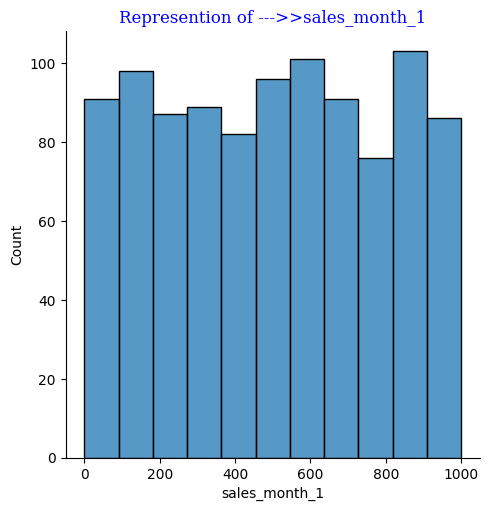

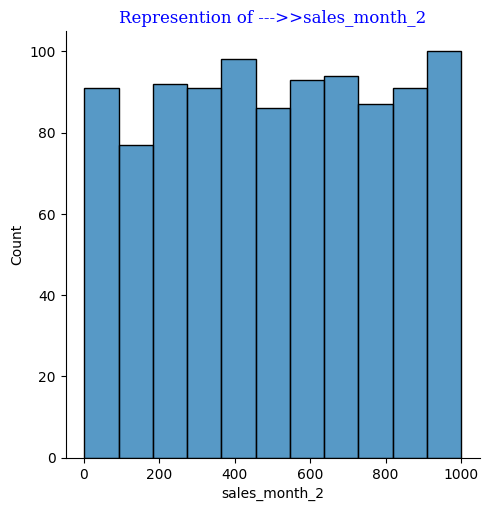

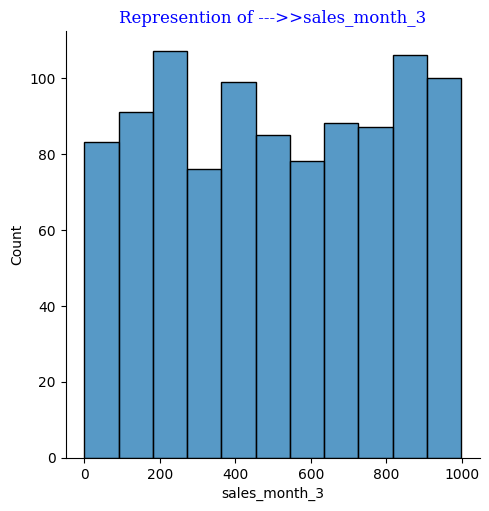

...

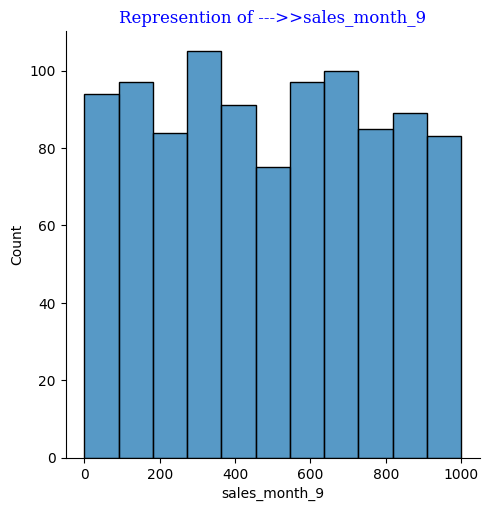

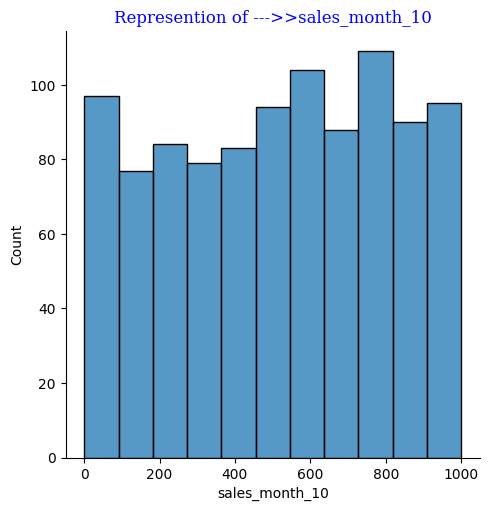

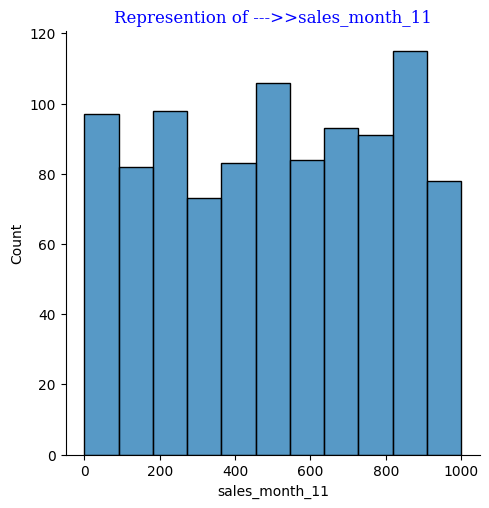

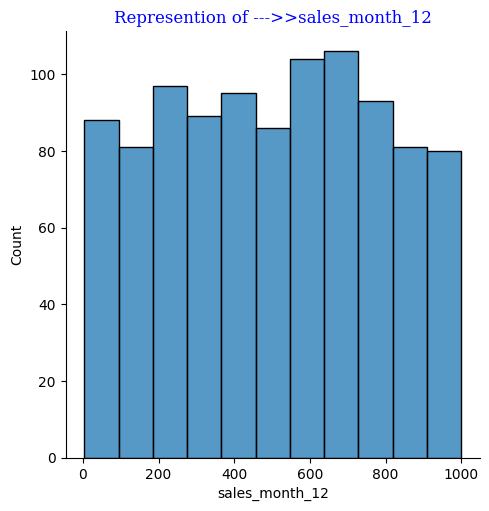

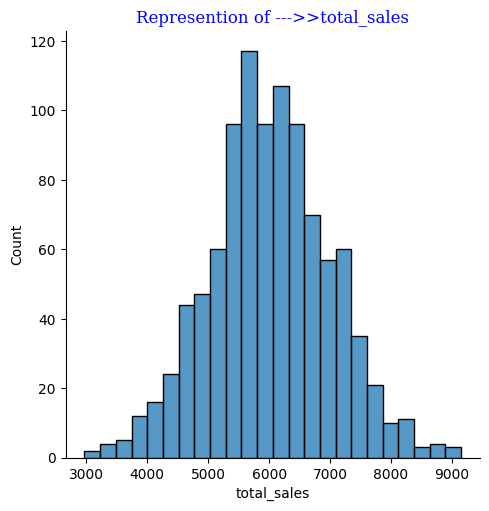

In [ ]:
# Represention of the ALL Features:
for col in data.select_dtypes(include="int64").columns:
    sns.displot(data[col])
    plt.title("Represention of --->>"+col,fontdict=f1)

## Data processing :

In [ ]:
# Standardize the data

scaler = StandardScaler()
x_scaled = scaler.fit_transform(data[features])
x_scaled

array([[-0.39628372, -1.13406386, -1.08640466, ...,  0.97792265,
         0.40599879,  1.42636517],
       [ 1.57693173,  0.14726771,  1.33447578, ...,  1.25366224,
         0.12793171, -1.2579259 ],
       [ 0.82791243,  1.25775506, -1.28844007, ..., -1.25940739,
         0.98646381, -0.28590813],
       ...,
       [-1.21040807, -1.47575227, -0.84892444, ...,  0.53464509,
        -0.94610238, -0.53496607],
       [ 1.57534043, -1.56117438,  0.68583578, ...,  0.41248199,
         1.27495841, -1.27868073],
       [-0.15156903, -0.79237544, -1.46211963, ...,  0.92556704,
        -1.22764529,  0.73453757]])

In [ ]:
# Convert all Categorical columns into Numerical columns :
# All data Become Numerical :

label_encoder=LabelEncoder()
for col in data.columns:
    data[col]=label_encoder.fit_transform(data[col])
data

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales,total_revenue
0,0,0,1,389,7,126,300,281,56,496,381,574,273,377,511,166,440,179,568,433
1,1,112,4,951,22,553,12,622,532,545,322,84,380,280,118,193,491,211,445,917
2,2,223,6,734,35,89,223,343,349,92,482,266,176,532,220,419,176,237,290,697
3,3,334,6,608,29,590,464,425,39,9,592,276,417,599,34,104,109,116,141,533
4,4,445,0,174,32,126,440,283,397,191,393,190,251,166,544,345,489,156,461,182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,995,996,4,98,26,299,304,220,88,498,422,616,171,96,35,362,397,238,269,85
996,996,997,4,912,38,431,11,566,83,52,14,72,246,435,68,546,463,294,59,706
997,997,998,5,148,3,169,464,66,124,418,137,218,415,307,164,225,569,411,275,145
998,998,999,5,948,2,439,130,118,205,398,541,81,40,603,332,175,39,239,64,731


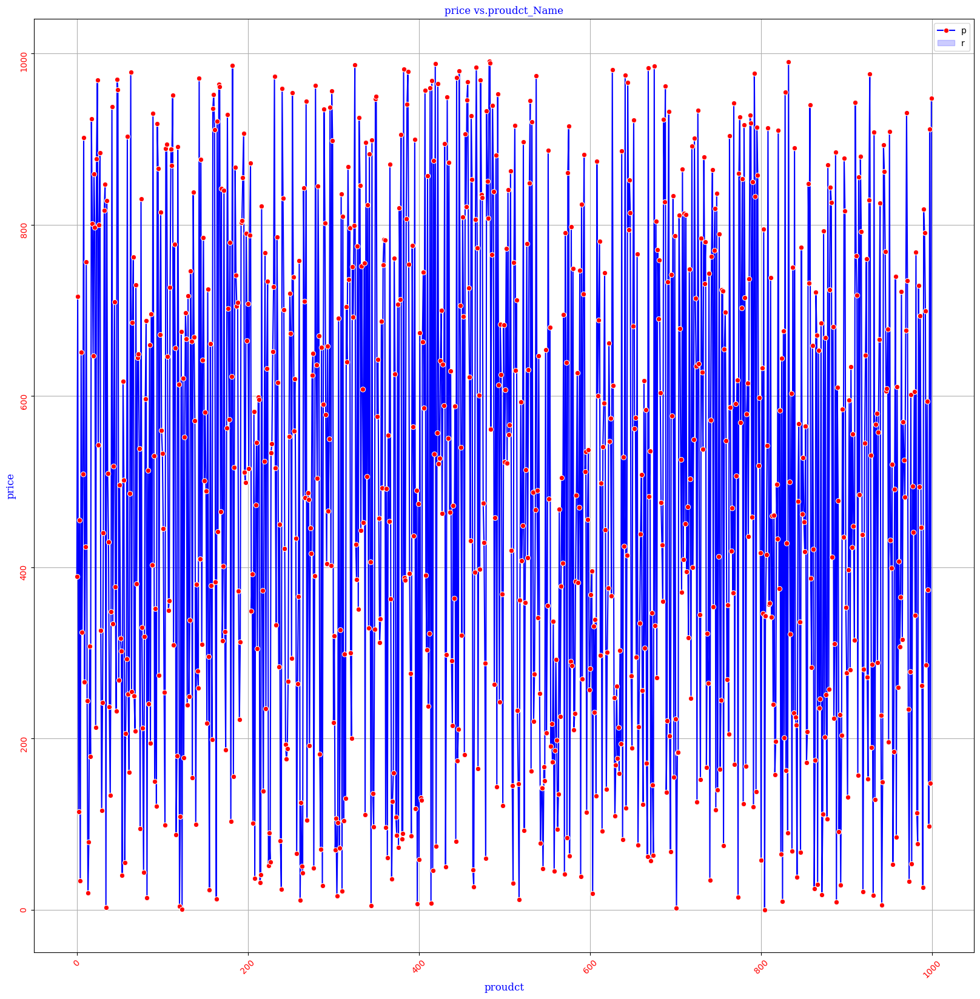

In [ ]:
#trend of price vs.proudct_name:

plt.figure(figsize=(20, 20))
price=data.groupby("product_name")["price"].mean().sort_values(ascending=False)
sns.lineplot(x=price.index,y=price.values,marker='o', linestyle='-', color='b',mfc="r")


plt.xlabel('proudct',fontdict=f1)
plt.ylabel('price',fontdict=f1)
plt.title('price vs.proudct_Name',fontdict=f1)
plt.xticks(rotation=45,color="r")
plt.yticks(rotation=90,color="r")
plt.legend("price of proudcts" )
plt.grid(True)
plt.show()

In [ ]:
# Calculate correlation with the configusion_matrix or Correlation Matrix :

correlation=data.select_dtypes("number").corr()
correlation

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales,total_revenue
product_id,1.000000,0.819939,0.040053,-0.023776,-0.040197,-0.009033,0.017836,0.078150,0.033198,-0.029009,-0.005326,-0.024176,0.046032,-0.001495,-0.049431,0.023818,0.044731,-0.028906,0.034141,-0.014385
product_name,0.819939,1.000000,0.007911,-0.032586,-0.029352,0.001738,-0.005615,0.051155,0.008808,-0.059927,0.000227,-0.039182,0.019722,0.021393,-0.059765,0.023849,0.019739,-0.018852,-0.012692,-0.035585
category,0.040053,0.007911,1.000000,0.025001,-0.032301,0.032171,0.032378,0.020025,-0.023387,-0.009248,-0.020486,0.040517,0.002530,-0.006068,-0.037697,-0.018870,0.001736,0.000472,-0.000198,0.025576
price,-0.023776,-0.032586,0.025001,1.000000,0.029548,0.042769,-0.034102,-0.003034,-0.024657,0.043727,0.030803,-0.051434,-0.026636,-0.045457,-0.007390,0.036601,0.005741,0.017145,-0.001535,0.960580
review_score,-0.040197,-0.029352,-0.032301,0.029548,1.000000,0.026992,0.023783,-0.076050,-0.012030,-0.016829,-0.039572,0.017506,-0.005570,0.021066,0.020095,0.016180,0.002739,-0.013151,-0.025717,0.024743
review_count,-0.009033,0.001738,0.032171,0.042769,0.026992,1.000000,-0.018907,-0.036838,-0.028517,-0.021197,-0.014735,-0.006223,0.029852,-0.000633,-0.019824,-0.063136,-0.032821,-0.024647,-0.070864,0.024767
sales_month_1,0.017836,-0.005615,0.032378,-0.034102,0.023783,-0.018907,1.000000,0.050749,0.007343,0.048300,0.015745,0.036101,0.034832,0.010595,0.043434,0.003173,0.004869,-0.036932,0.342651,0.057584
sales_month_2,0.078150,0.051155,0.020025,-0.003034,-0.076050,-0.036838,0.050749,1.000000,-0.012940,-0.100624,0.056268,0.034383,-0.040666,-0.022903,0.004450,-0.017892,-0.017082,0.022781,0.272799,0.059868
sales_month_3,0.033198,0.008808,-0.023387,-0.024657,-0.012030,-0.028517,0.007343,-0.012940,1.000000,-0.009660,-0.008464,0.017966,-0.034669,-0.056505,-0.032712,0.057729,-0.010966,0.038604,0.282938,0.049268
sales_month_4,-0.029009,-0.059927,-0.009248,0.043727,-0.016829,-0.021197,0.048300,-0.100624,-0.009660,1.000000,-0.015862,0.045868,0.018232,0.005942,-0.018971,0.038888,0.044652,-0.033919,0.288451,0.112238


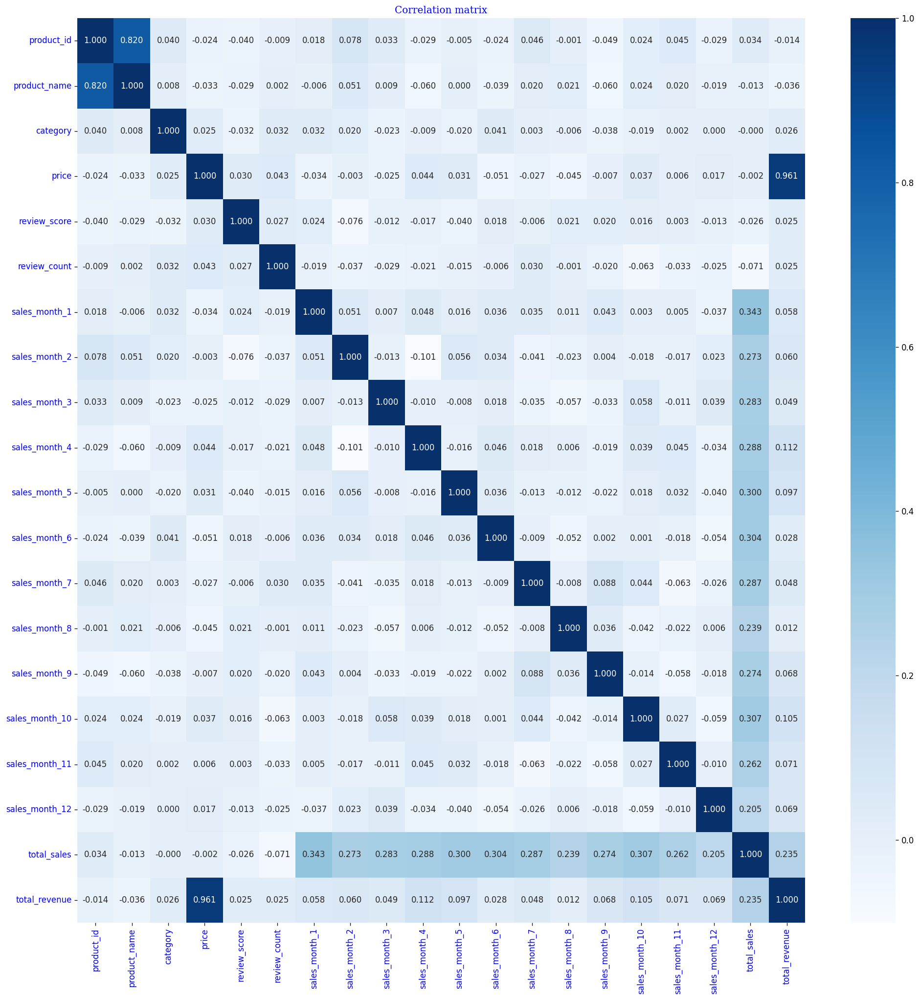

In [ ]:
# plot heatmap_correlation:
plt.figure(figsize=(20,20),dpi=120)
plt.title("Correlation matrix",fontdict=f1)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=90,color="b")
sns.heatmap(correlation,annot=True,fmt="0.03f",cmap='Blues')
plt.show()

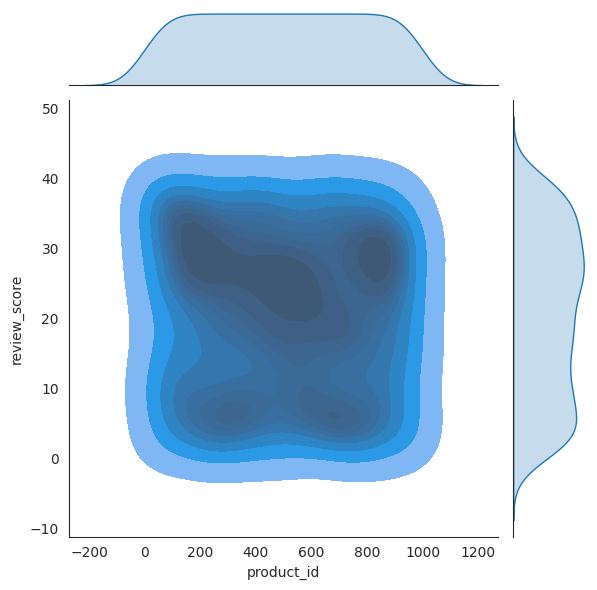

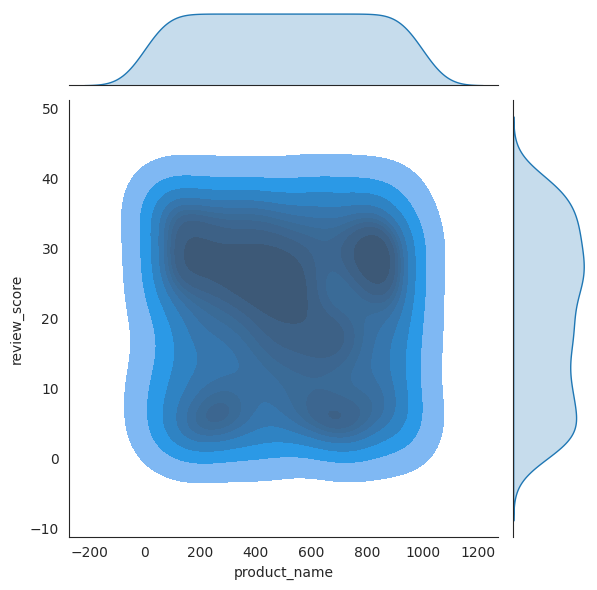

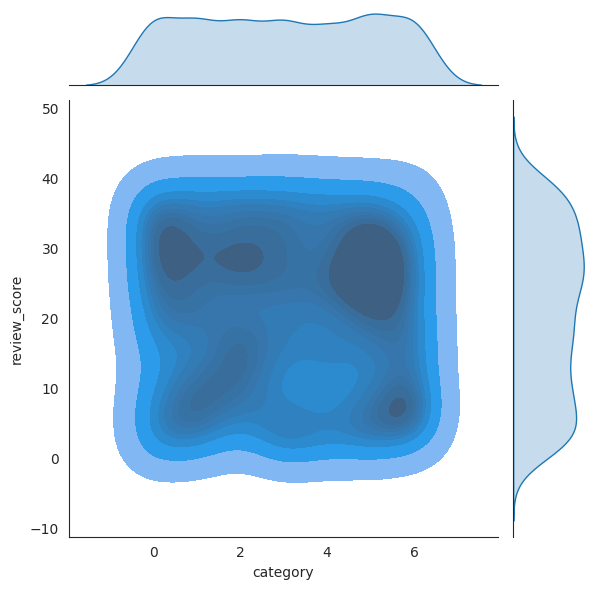

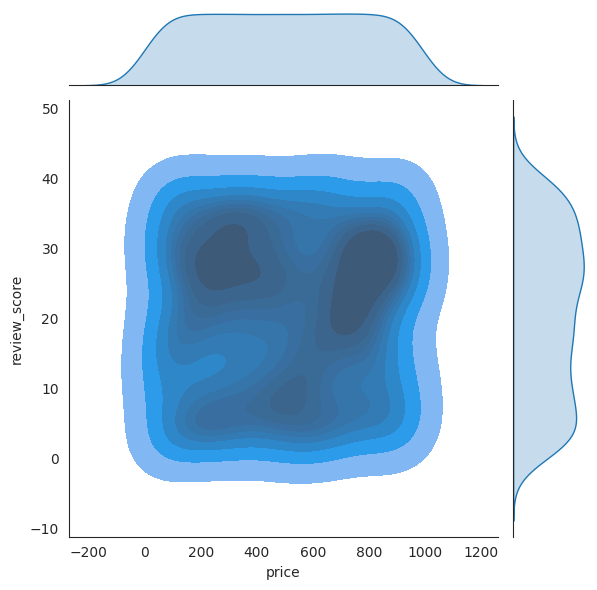

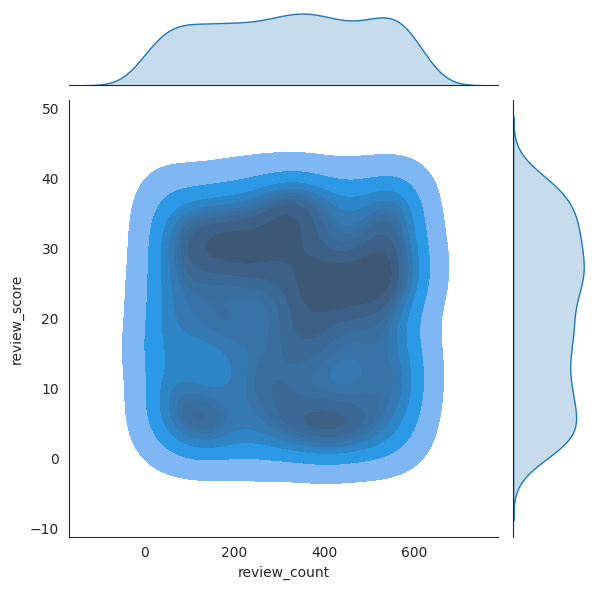

...

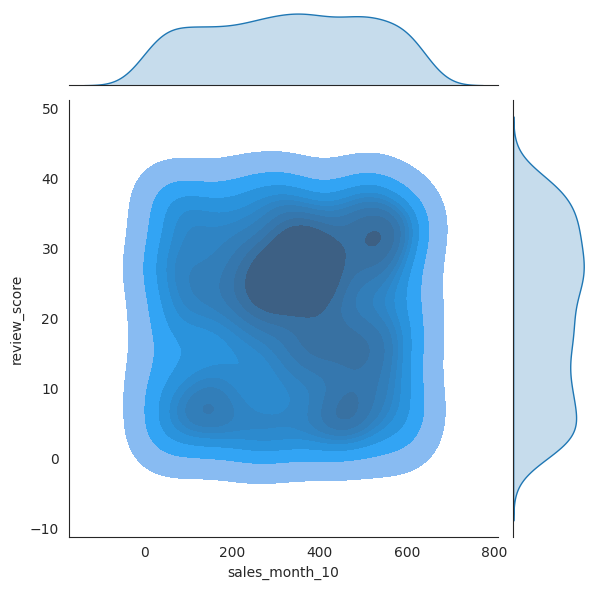

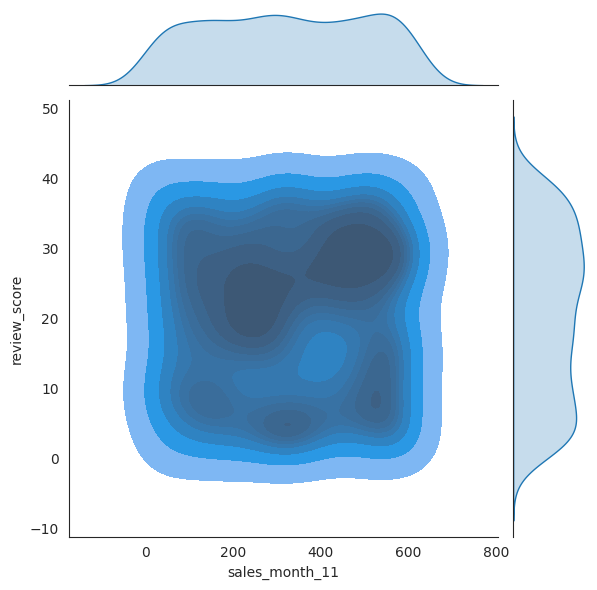

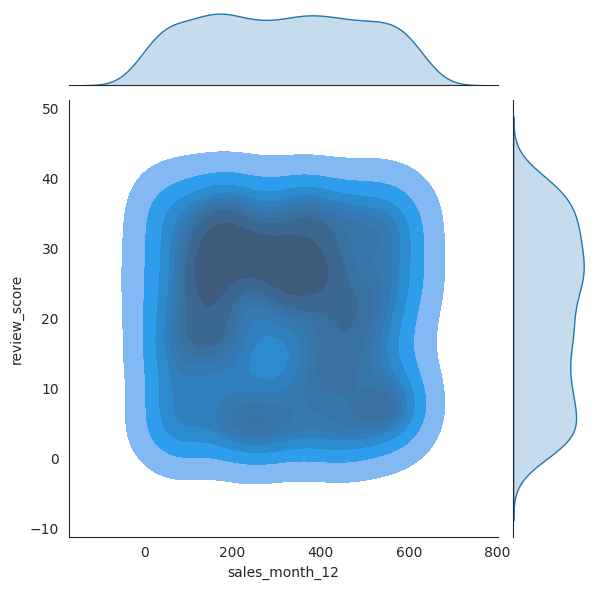

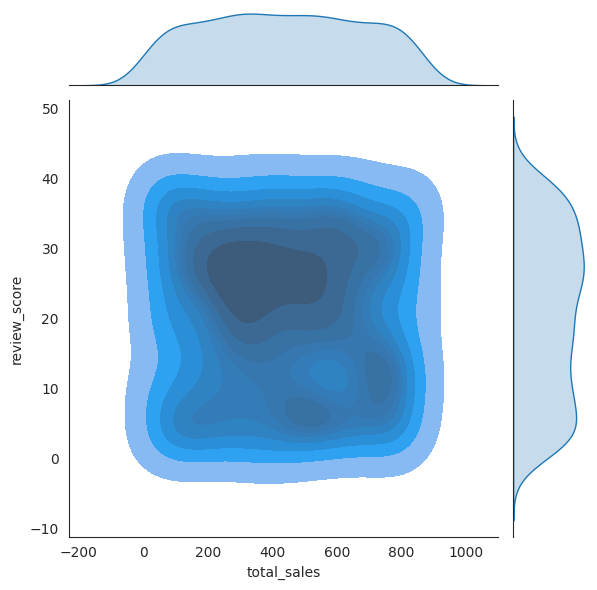

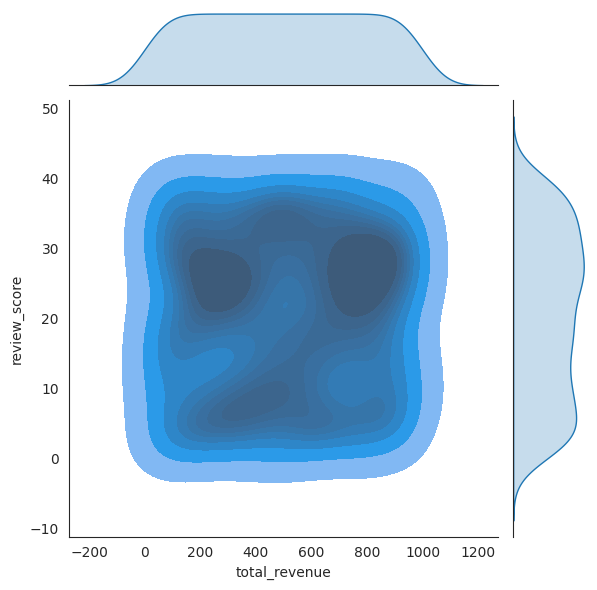

In [ ]:
# observe the contor of review_score with the other features
for col in data.select_dtypes("number"):
    if col !="review_score":
       with sns.axes_style("white"):
          sns.jointplot(x=data[col],y=data["review_score"],kind="kde",fill=True)

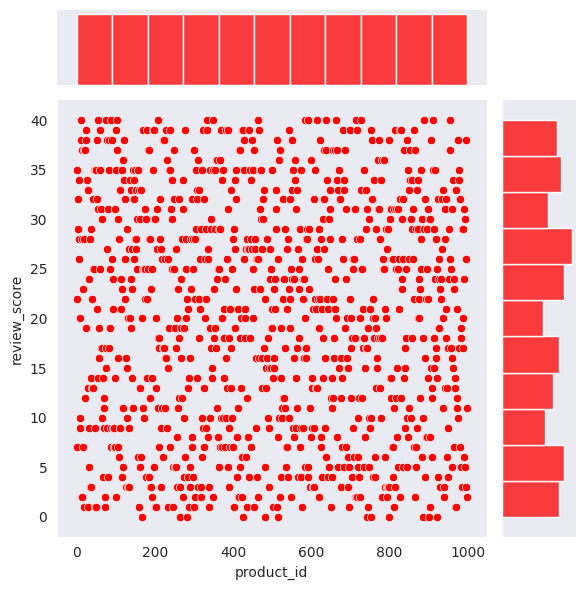

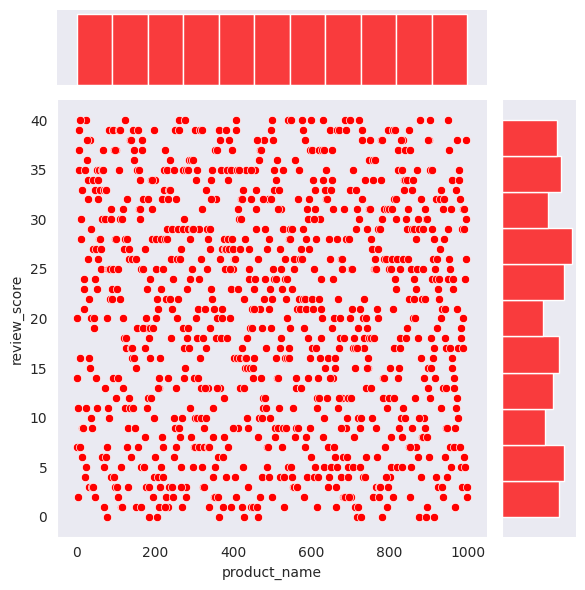

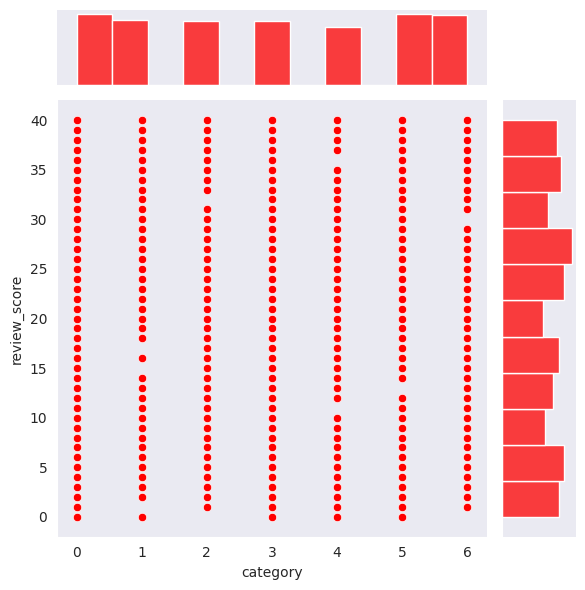

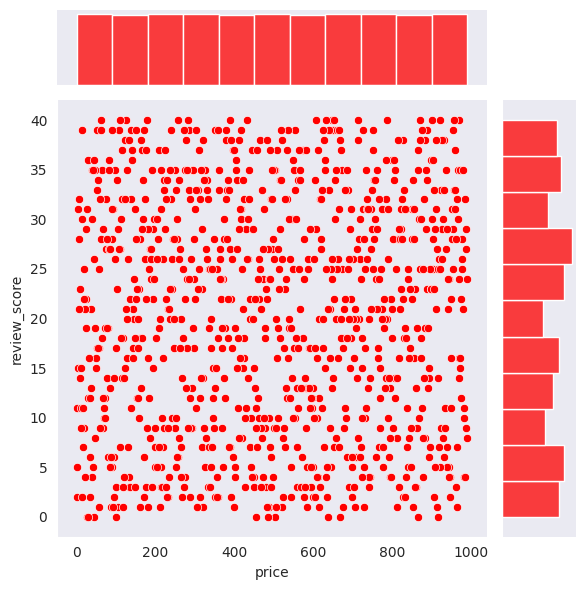

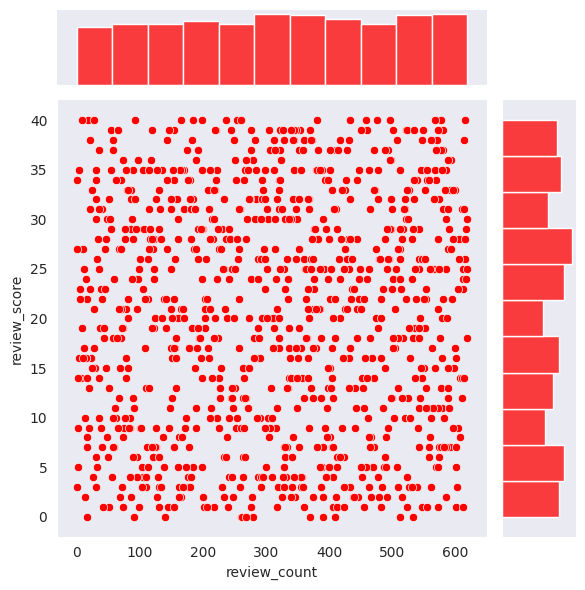

...

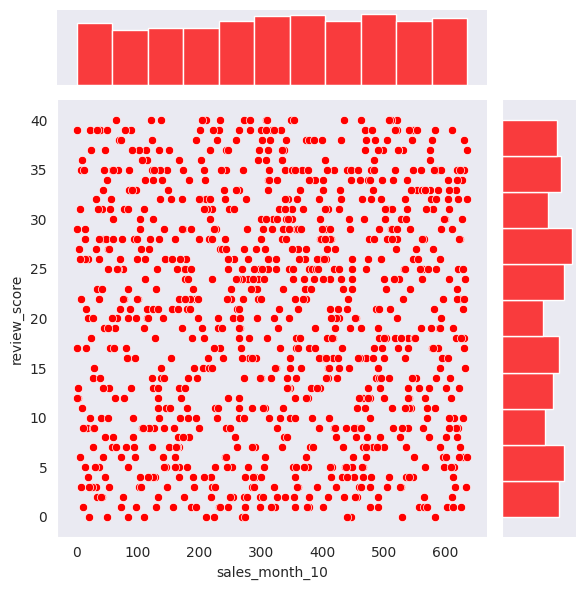

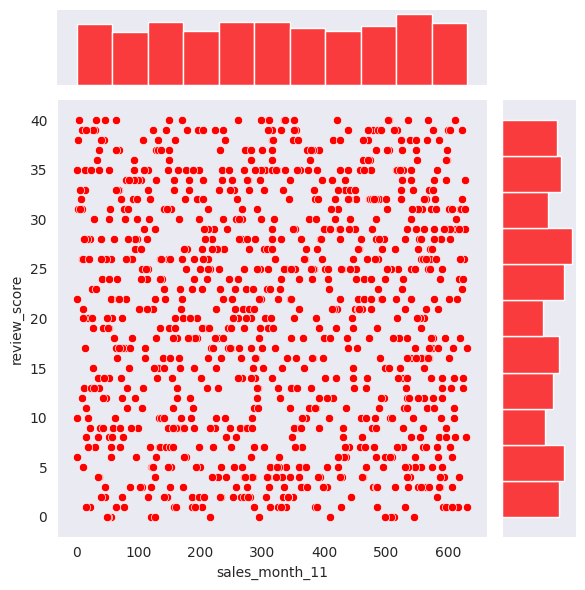

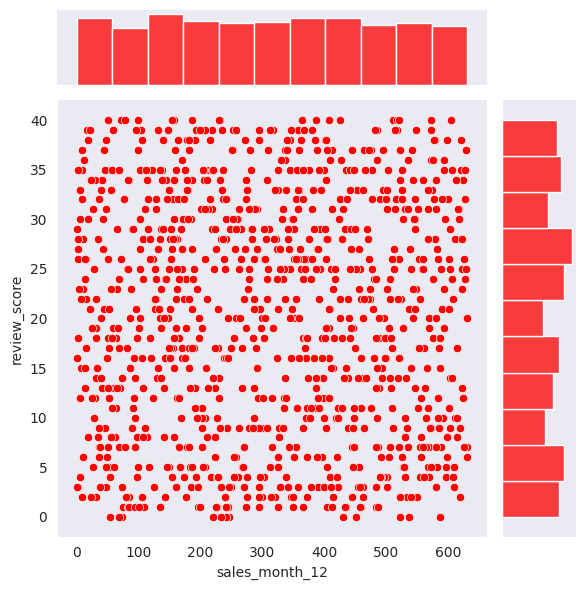

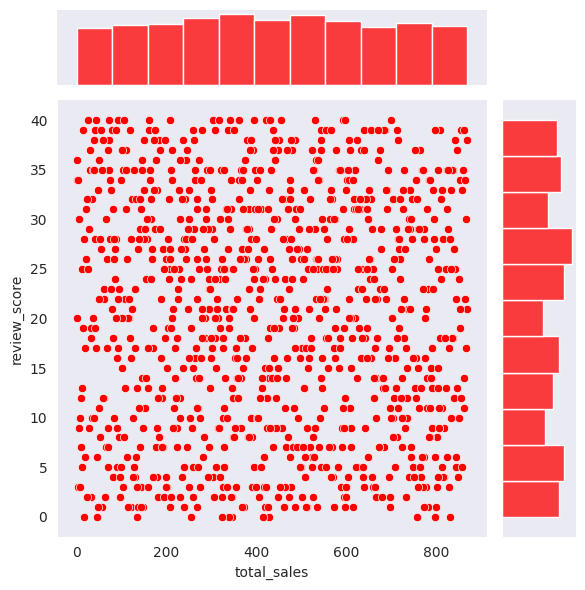

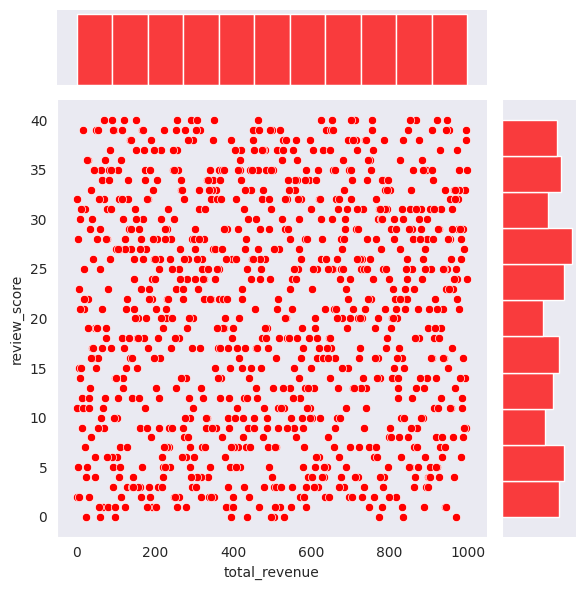

In [ ]:
# observe the contor of review_score with the other features
for col in data.select_dtypes("number"):
    if col !="review_score":
       with sns.axes_style("dark"):
          sns.jointplot(x=data[col],y=data["review_score"],kind="scatter",color="r")

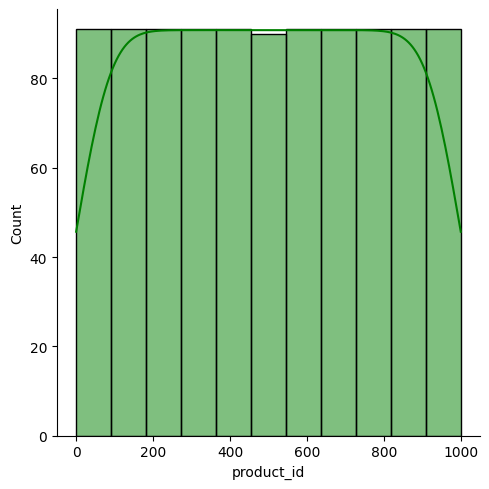

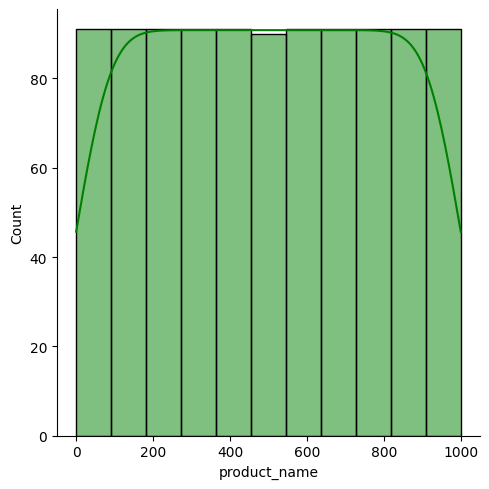

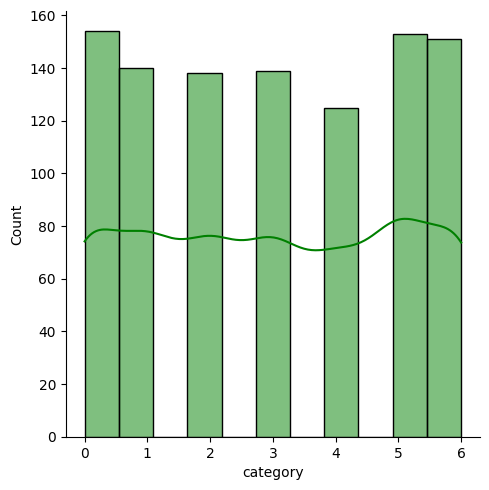

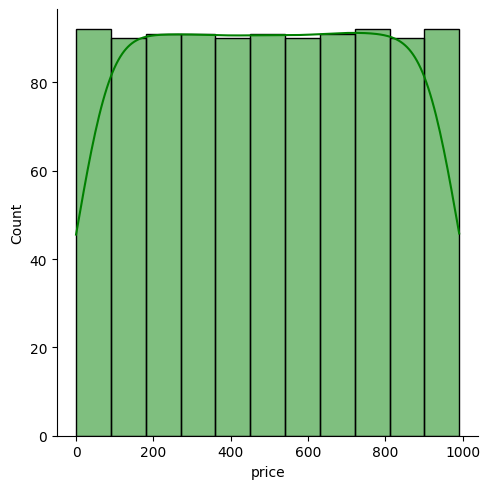

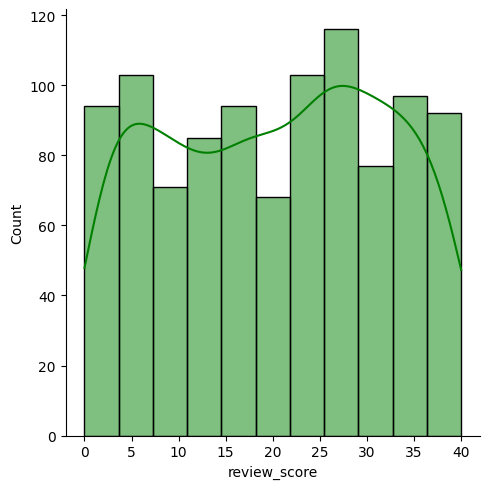

...

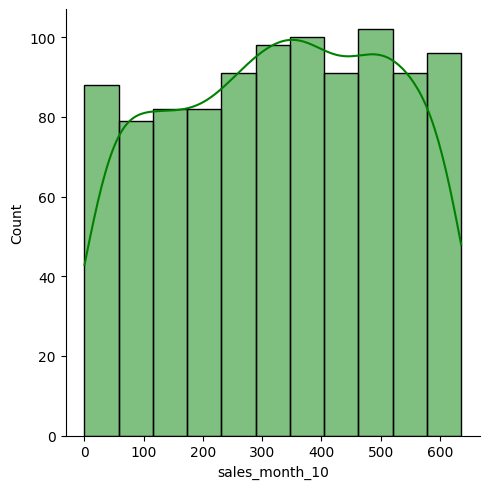

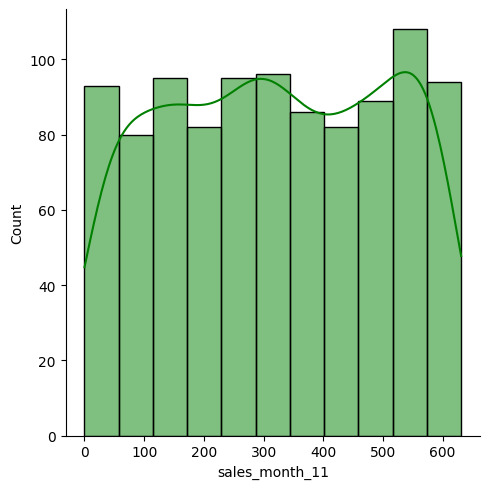

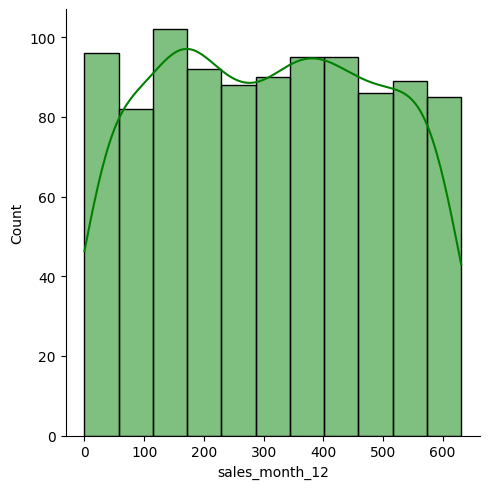

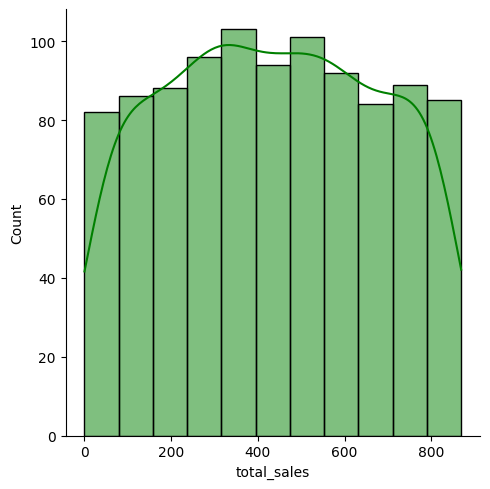

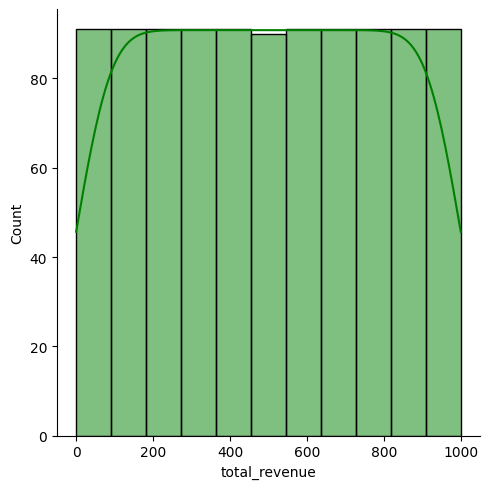

In [ ]:
# distplots with kde:
for col in data.columns:
    sns.displot(data[col],kde=True,color="g")

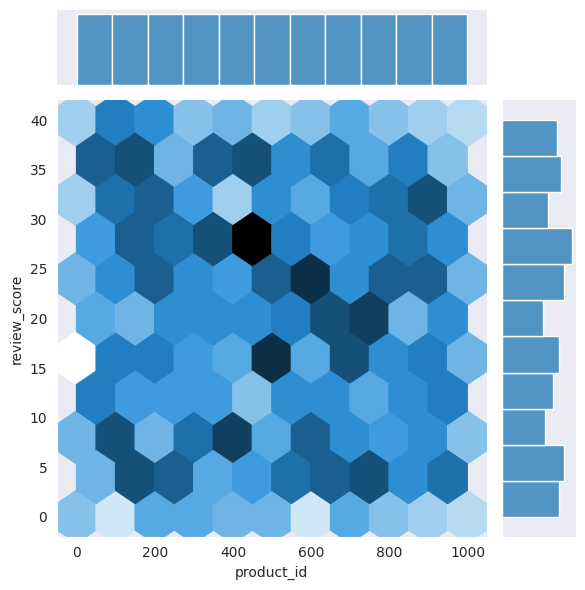

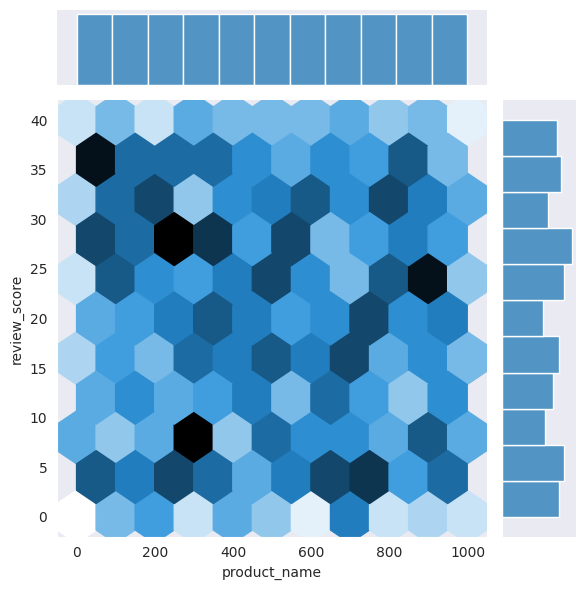

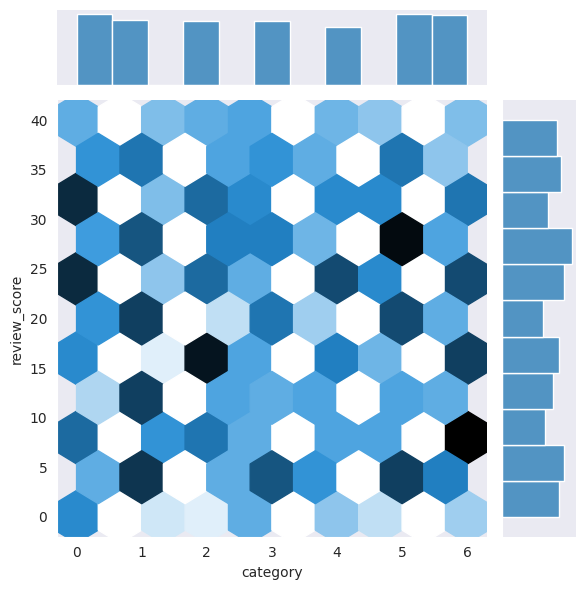

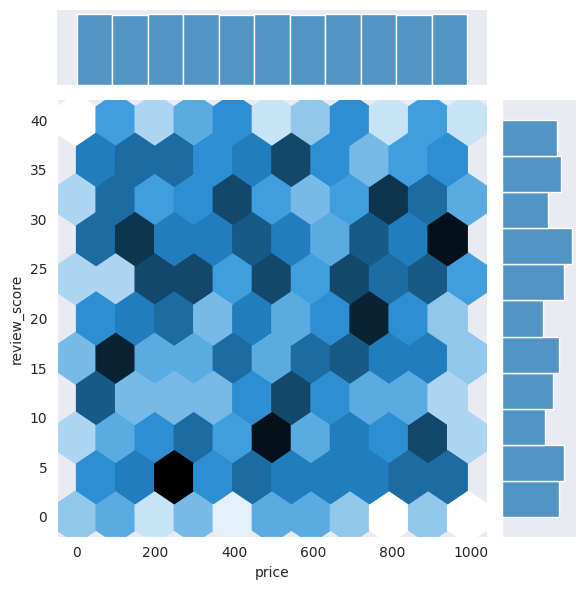

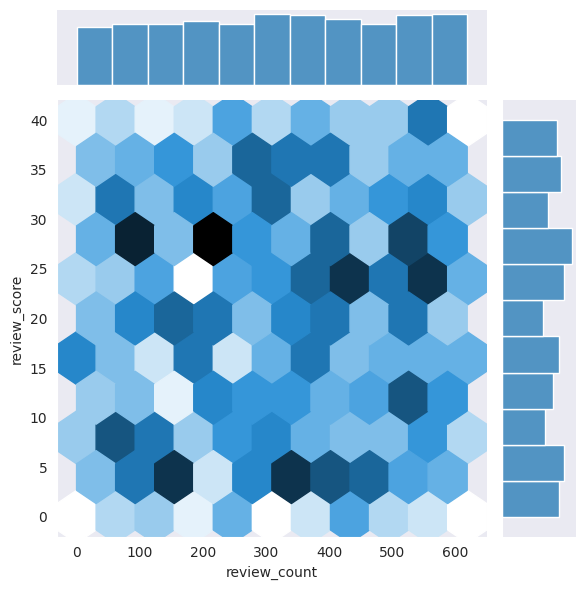

...

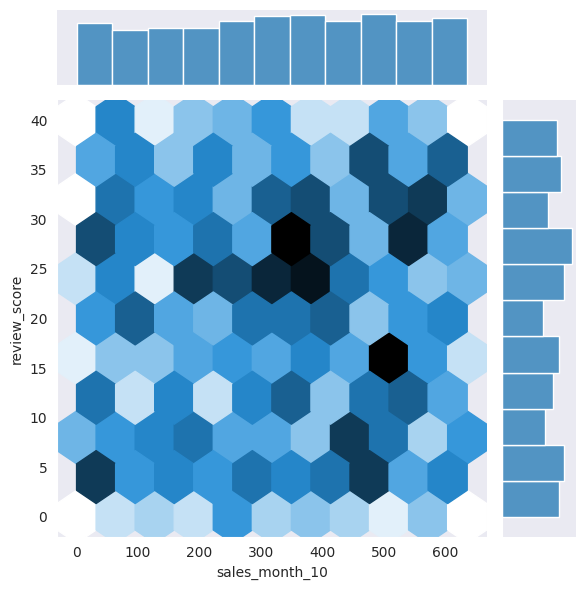

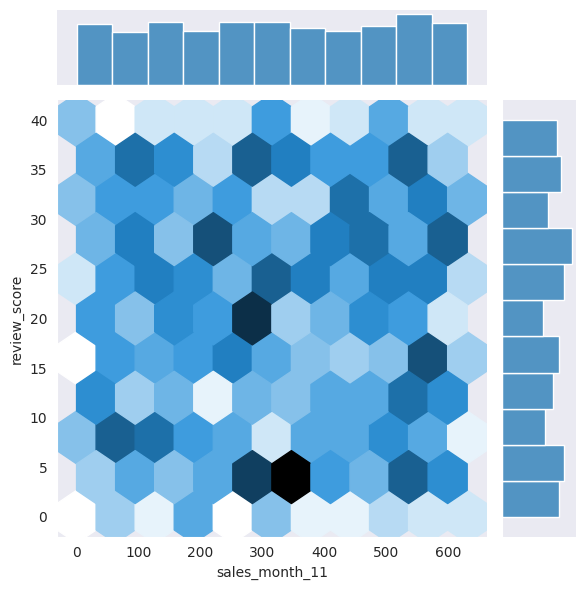

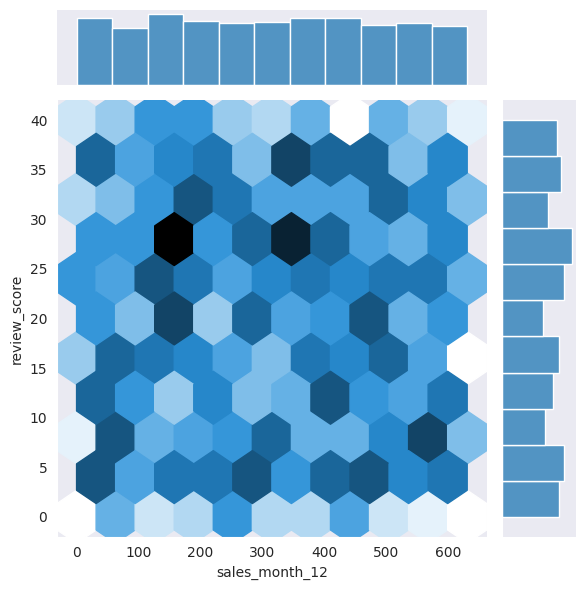

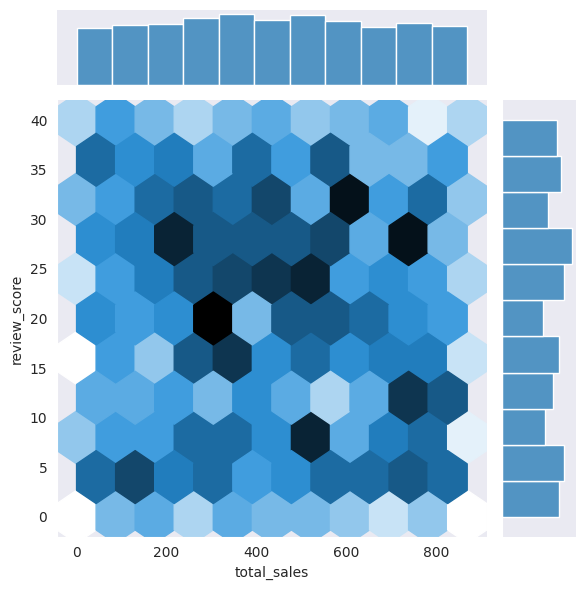

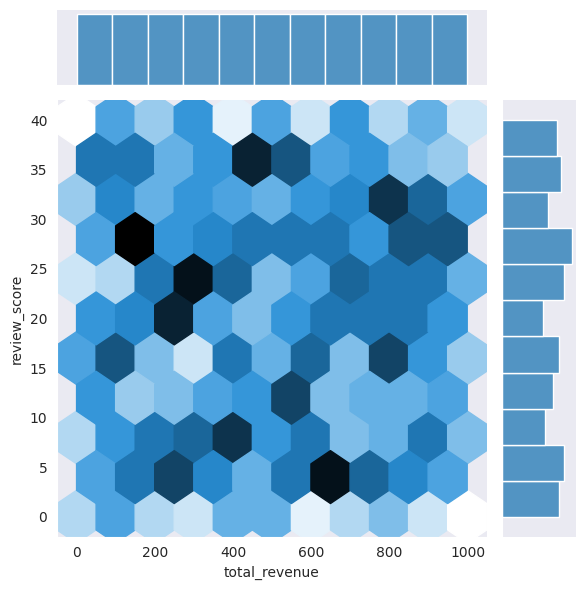

In [ ]:
# observe the contor of review_score with the other features
for col in data.select_dtypes("number"):
    if col !="review_score":
       with sns.axes_style("dark"):
          sns.jointplot(x=data[col],y=data["review_score"],kind="hex")

In [ ]:
print("""
 * Here Reach to End of project

 * Devloper : karthikeyan
""")


 * Here Reach to End of project 
 
 * Devloper : karthikeyan 



link of My works : https://www.kaggle.com/abdalrhamnhebishy